In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

%matplotlib notebook
import matplotlib as mpl
import matplotlib.pyplot as pl
import numpy as np
import os
import sys
import math
from datetime import datetime
import time
import pandas as pd
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)
    
import scipy
from scipy.optimize import curve_fit
#import sympy as sp
from scipy import stats  

#from labellines import labelLine, labelLines
from matplotlib.lines import Line2D

from scipy.optimize import curve_fit, leastsq

def linear (a,b,x):
    return (a*x)+b

def gaussian(x, mu, sig, A):
    return A*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))
#g =  gaussian(np.linspace(-100, 100, 2000),0.0,10.0)

def bimodal(x,mu1,sigma1,A1,mu2,sigma2,A2):
    return gaussian(x,mu1,sigma1,A1)+gaussian(x,mu2,sigma2,A2)


def defl_cont(x,x_am,x_ch,mu1,sig1,A1,tau,A3,mu2,sig2,A2):
    return np.piecewise(x, [(x < x_am) , (x > x_am) & (x < x_ch) , (x > x_ch)], [lambda x: A1*np.exp(-np.power(x - mu1, 2.) / (2 * np.power(sig1, 2.))), 
                                                                                 lambda x: A1*np.exp(-np.power(x_am - mu1, 2.) / (2 * np.power(sig1, 2.))) +
                                                                                           A3*(np.exp(-x/tau) - np.exp(-x_am/tau))+
                                                                                           A2*(np.exp(-np.power(x_ch - mu2, 2.) / (2 * np.power(sig2, 2.)))),
                                                                                 lambda x: A1*np.exp(-np.power(x_am - mu1, 2.) / (2 * np.power(sig1, 2.))) +
                                                                                           A3*(np.exp(-x_ch/tau) - np.exp(-x_am/tau)) + 
                                                                                           #A2*(np.exp(-np.power(x - mu2, 2.) / (2 * np.power(sig2, 2.)) - np.exp(-np.power(x_ch - mu2, 2.) / (2 * np.power(sig2, 2.)))))])
                                                                                           A2*(np.exp(-np.power(x - mu2, 2.) / (2 * np.power(sig2, 2.))))])

In [2]:
mpl.rcParams['font.size'] = 14
####################### Definition of variables
crit_angle = 16     #### critical angle
cry_length = 4e-3    #### crystal length
t = 0                #### torsion parameter initialisation
o = 0                #### torsionoffset initialisation

energy = 180
critical_angle = 10.*np.sqrt(400./energy)
print(critical_angle)
#critical_angle=16

14.907119849998598


In [3]:
####################### Dataframe loading, units adjustment and deflection 
data_1 = pd.DataFrame()
data_1 = pd.read_csv("ACP82_6709.dat", sep = ",", header= None, names=['gonio','d0_x','d0_y','thetaIn_x','thetaOut_x','thetaIn_y','thetaOut_y'])

data_1['thetaIn_x'] = data_1['thetaIn_x']*1e6
data_1['thetaIn_y'] = data_1['thetaIn_y']*1e6
data_1['thetaOut_x'] = data_1['thetaOut_x']*1e6
data_1['thetaOut_y'] = data_1['thetaOut_y']*1e6


data_1['defl_x'] = data_1['thetaOut_x']-data_1['thetaIn_x']
data_1['defl_y'] = data_1['thetaOut_y']-data_1['thetaIn_y']


In [4]:
####################### just some checks 

data_1.gonio.mean()

thetaX_min = data_1.thetaIn_x.min()
deflX_min = data_1.defl_x.min()
thetaX_max = data_1.thetaIn_x.max()
deflX_max = data_1.defl_x.max()
d0_y_min = data_1.d0_y.min()
d0_y_max = data_1.d0_y.max()

print(d0_y_max,d0_y_min)

display(data_1)

11.77913820332734 -22.08265091150511


,gonio,d0_x,d0_y,thetaIn_x,thetaOut_x,thetaIn_y,thetaOut_y,defl_x,defl_y
0,1570766.6,-0.392686,-1.805191,2.852131,4.875887,-4.742798,0.956495,2.023756,5.699293
1,1570766.6,2.168392,-2.535664,61.359161,75.279750,-24.733621,-20.664061,13.920589,4.069560
2,1570766.6,6.027225,2.427705,647.163982,660.137216,450.671271,468.543948,12.973234,17.872677
3,1570766.6,-1.853840,-1.078557,-15.061941,-4.806466,-30.536117,-44.076343,10.255475,-13.540226
4,1570766.6,-0.710525,1.005621,5.416641,-2.918001,46.847826,32.890744,-8.334642,-13.957082
...,...,...,...,...,...,...,...,...,...
12890818,1570766.6,-3.214777,0.954585,-48.945788,-45.039469,-48.713966,-47.763140,3.906319,0.950826
12890819,1570766.6,-0.489439,-2.968833,-10.594802,-26.032599,-14.972844,-29.184174,-15.437797,-14.211331
12890820,1570766.6,-1.205008,3.090122,6.923519,-11.487394,56.294707,78.348290,-18.410913,22.053583
12890821,1570766.6,0.497850,-2.143487,24.659571,31.856833,-63.597088,-65.723079,7.197262,-2.125991


<IPython.core.display.Javascript object>


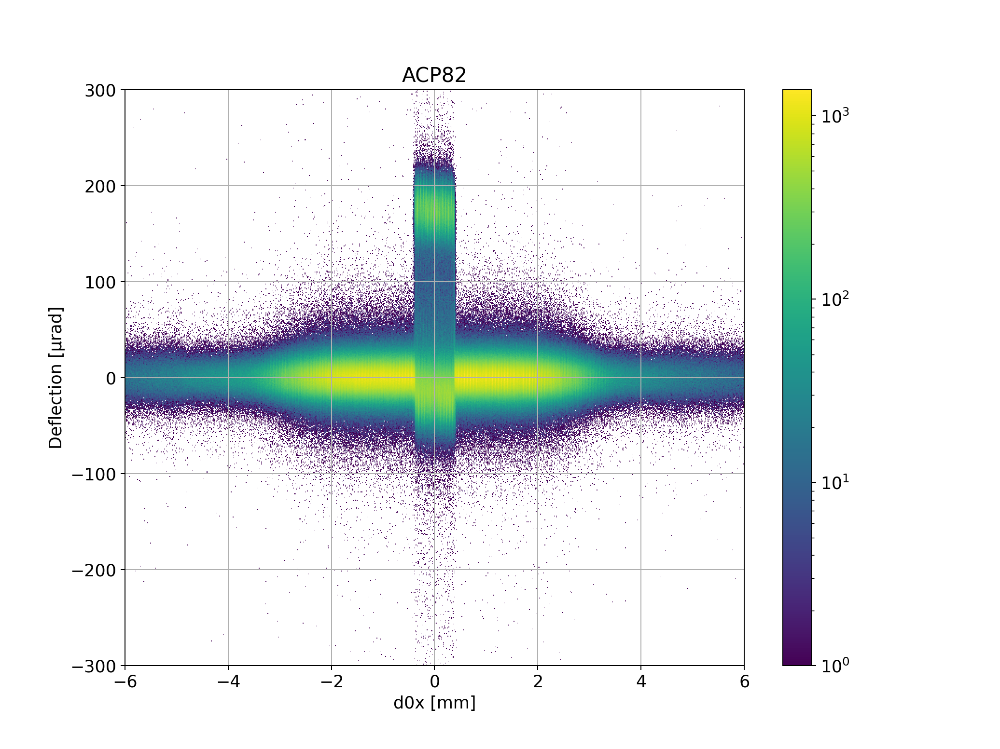

12672542.0


<IPython.core.display.Javascript object>


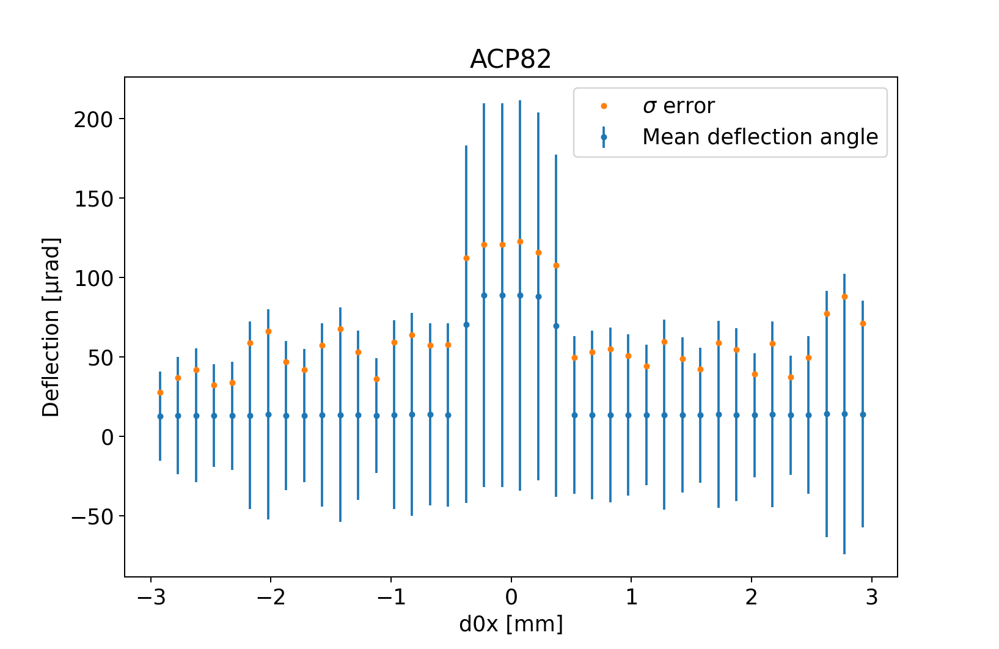

In [24]:
####################### Geometrical Cuts #######################
####################### Visualisation plot
fig, ax = pl.subplots()


xbins = np.linspace(-6, 6.,1000)
ybins = np.linspace(-300, 300, 600)


counts, xedges, yedges, _ = pl.hist2d(data_1['d0_x'],data_1['defl_x'], bins=(xbins, ybins), 
                                       norm=mpl.colors.LogNorm(),
                                       cmap=pl.cm.viridis)

print (np.sum(counts))
cbar = pl.colorbar() 
pl.grid()   
pl.show()



####################### analysis by looking at mean impact for each impact x slices bins 40, range -3,3

means_result = scipy.stats.binned_statistic(data_1['d0_x'], [data_1['defl_x'], data_1['defl_x']**2], bins=40, 
                                             range=(-3.,3.), 
                                            statistic='std')

means, means2 = means_result.statistic
standard_deviations = np.sqrt(means2 - means**2)
bin_edges = means_result.bin_edges
bin_centers = (bin_edges[:-1] + bin_edges[1:])/2.

#print (bin_centers,means)

fig1, ax1 = pl.subplots()


pl.errorbar(x=bin_centers, y=means, yerr=standard_deviations, linestyle='none', marker='.',label='Mean deflection angle')
pl.plot(bin_centers, standard_deviations, linestyle='none', marker='.',label=r'$\sigma$ error')
ax.set_title('ACP82')
ax.set_xlabel('d0x [mm]')
ax.set_ylabel('Deflection [µrad]')
ax1.set_title('ACP82')
ax1.set_xlabel('d0x [mm]')
ax1.set_ylabel('Deflection [µrad]')

ax1.legend()

cut = bin_centers[means>10]
#print(r'Geometrical horizontal cut at {:2.2f} mm and {:2.2f} mm'.format(cut.min(),cut.max()))



<IPython.core.display.Javascript object>


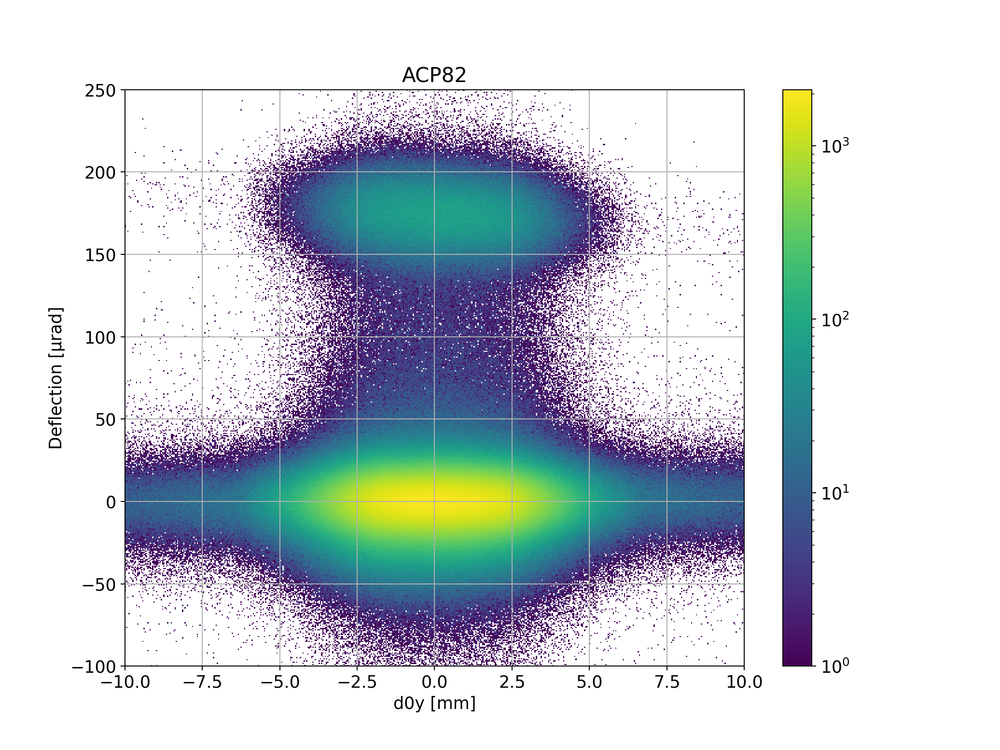

12840442.0


<IPython.core.display.Javascript object>


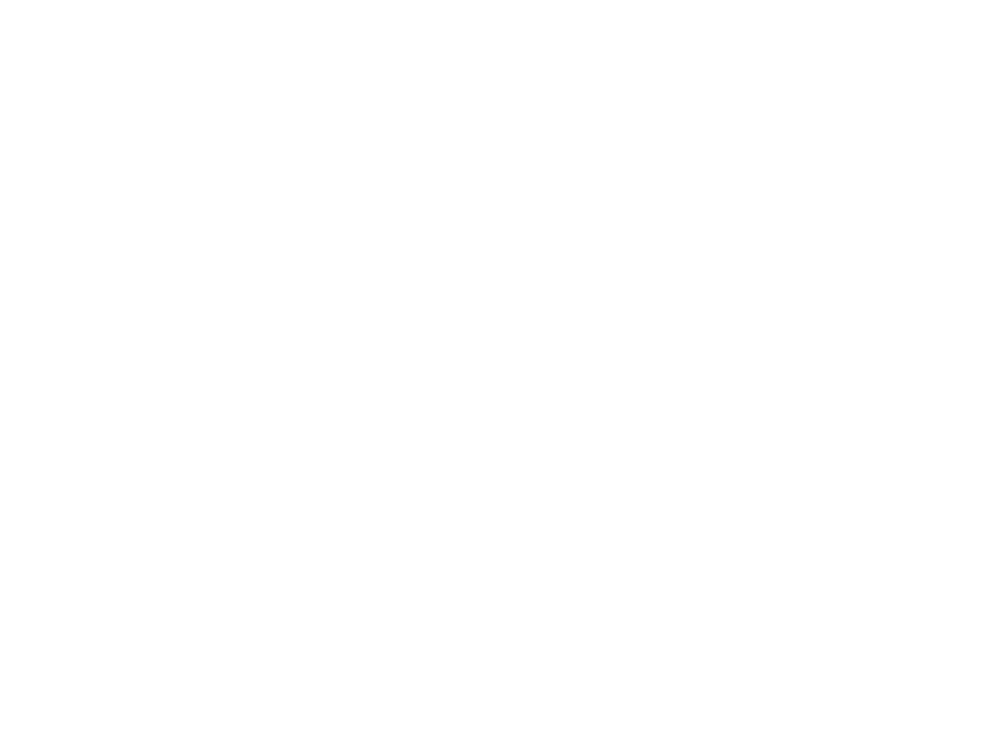

In [6]:
####################### Visualisation plots
fig1, ax1 = pl.subplots()
ax1.set_title('ACP82')
ax1.set_xlabel('d0y [mm]')
ax1.set_ylabel('Deflection [µrad]')


xbins1 = np.linspace(-10, 10, 500)
ybins1 = np.linspace(-100, 250,500)



counts1, xedges1, yedges1, _ = pl.hist2d(data_1['d0_y'],data_1['defl_x'], bins=(xbins1, ybins1), 
                                       norm=mpl.colors.LogNorm(),
                                       cmap=pl.cm.viridis
                                     )

print (np.sum(counts1))
cbar = pl.colorbar() 
pl.grid()   
pl.show()


torsion = data_1.loc[(data_1['defl_x']>140.) & (data_1['defl_x']<210.) &  (data_1['d0_y']<2) & (data_1['d0_y']>-2) & (data_1['d0_x']<0.5) & (data_1['d0_x']>-0.5)]



fig2, ax2 = pl.subplots()
#pl.ylim(100,250)
#pl.xlim(-2.5,3.5)
pl.hist2d(torsion['d0_y'],torsion['defl_x'],bins=(100,100), 
                                       norm=mpl.colors.LogNorm(),
                                       cmap=pl.cm.viridis 
          )


par, cov = curve_fit(linear,torsion['d0_y'],torsion['defl_x'])
pl.plot(torsion['d0_y'], linear(par[0], par[1],torsion['d0_y']))
#print (np.sum(counts1))
#cbar = pl.colorbar() 
pl.grid()   
pl.show()

<IPython.core.display.Javascript object>


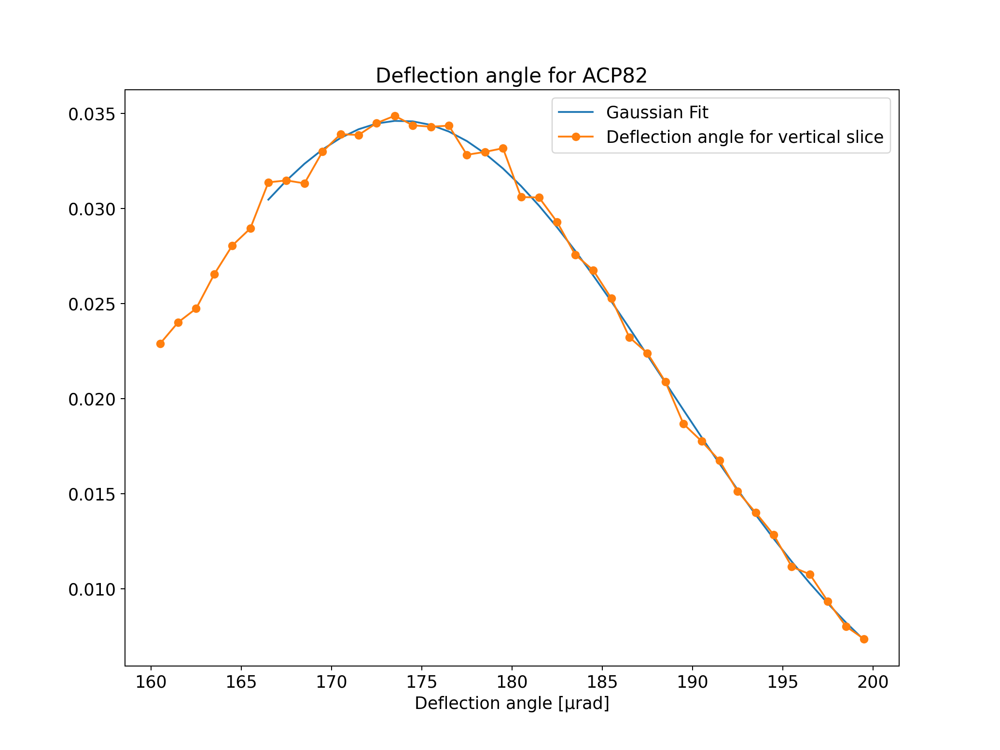

[1.7e+02 1.0e+01 3.0e-03]
[1.73851018e+02 1.45436043e+01 3.46207516e-02]


/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


(array([173.5]), 173.85101842909776, 0.00026556974146999234)

In [7]:
#######OWN FUNCTION FOR MODE
mode_bins = 41

def func(ylim1,ylim2,rang1,rang2,bins,mu,A):
    selection = data_1.loc[(data_1['d0_y']<rang2) & (data_1['d0_y']>rang1) & (data_1['d0_x']<0.5) & (data_1['d0_x']>-0.5)]# & (data_1['thetaIn_x']<crit_angle) & (data_1['thetaIn_x']>-crit_angle)]

    fig, ax = pl.subplots()
    xmin, xmax = 0,20
    lnspc = np.linspace(xmin, xmax, bins)

    d_f, v_f  = np.histogram(selection['defl_x'],bins=lnspc,density=True)#,range=(rang1,rang2))
    
    func.c_f = (v_f[:-1] + v_f[1:]) / 2

    func.x_max = func.c_f[d_f==max(d_f)]
    
    param_o = (mu,10,A)
    
    func.par_o, cov_o = curve_fit(gaussian,func.c_f,d_f,param_o)

    
    
    xmin, xmax = func.par_o[0]-np.abs(func.par_o[1]), func.par_o[0]+3*np.abs(func.par_o[1])
    print(func.par_o)
    lnspc = np.linspace(xmin, xmax, bins)

    d_f, v_f  = np.histogram(selection['defl_x'],bins=lnspc,density=True)#,range=(rang1,rang2))
    
    func.c_f = (v_f[:-1] + v_f[1:]) / 2

    func.x_max = func.c_f[d_f==max(d_f)]
    
    param_o = func.par_o
    
    func.par_o, cov_o = curve_fit(gaussian,func.c_f[6:],d_f[6:],param_o)
    
    
    pl.plot(func.c_f[6:], gaussian(func.c_f[6:],func.par_o[0],func.par_o[1],func.par_o[2]),label='Gaussian Fit')
    
    print(func.par_o)
    
    func.chi2 = sum((d_f-gaussian(func.c_f,func.par_o[0],func.par_o[1],func.par_o[2]))**2/d_f)
    
    #print(func.x_max)
    pl.plot(func.c_f,d_f,'-o',label='Deflection angle for vertical slice')#,label=f'{ylim1}-{ylim2} mm')
    #pl.hlines(max(d_f),func.x_max-10,func.x_max+10,'r')
    pl.legend(loc='best')
    pl.xlabel('Deflection angle [µrad]')
    pl.title('Deflection angle for ACP82')
    
    
    #textstr = '\n'.join((
    #r'Chi2 = %.6f' % (func.chi2),))
    #props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
    #ax.text(0.75, 0.95, textstr, transform=ax.transAxes, fontsize=10,
     #   verticalalignment='top', bbox=props)
    
    
    return func.x_max, func.par_o[0], func.chi2
   
    



    
#Changing selection naturally raises channeling peak and lowers amorphous peak.
#func(-4,4,-1,1,51)
#func(-3,3,-1,1,51)
func(-2,2,-4,4,mode_bins,170,0.003)
#func(-2,2,-1,1,51,42,0.003)
#func(-2,2,-0.5,0.5,51,42,0.003)

<IPython.core.display.Javascript object>


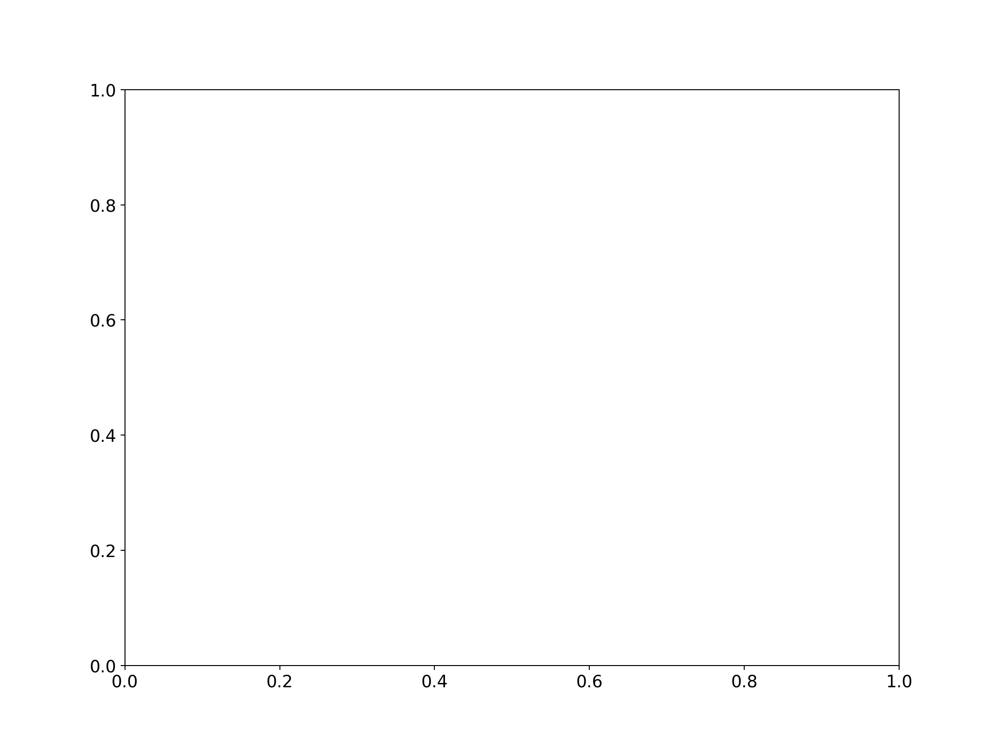

<IPython.core.display.Javascript object>


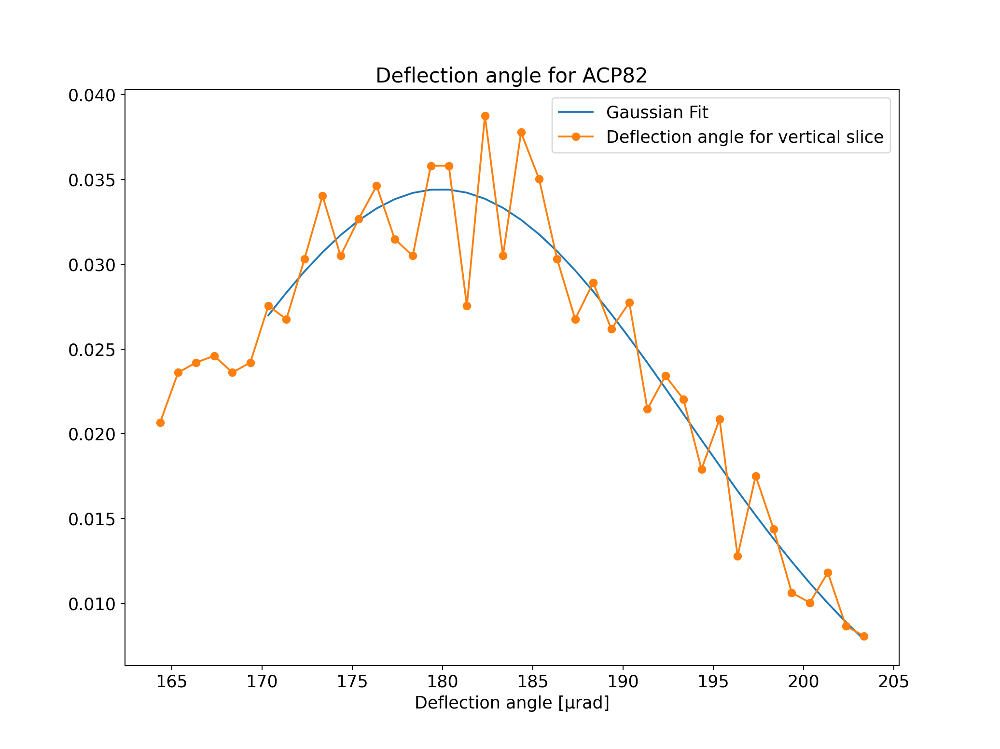

[1.73851018e+02 1.00000000e+01 3.46207516e-02]
[1.79876966e+02 1.36576092e+01 3.44230265e-02]


/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


<IPython.core.display.Javascript object>


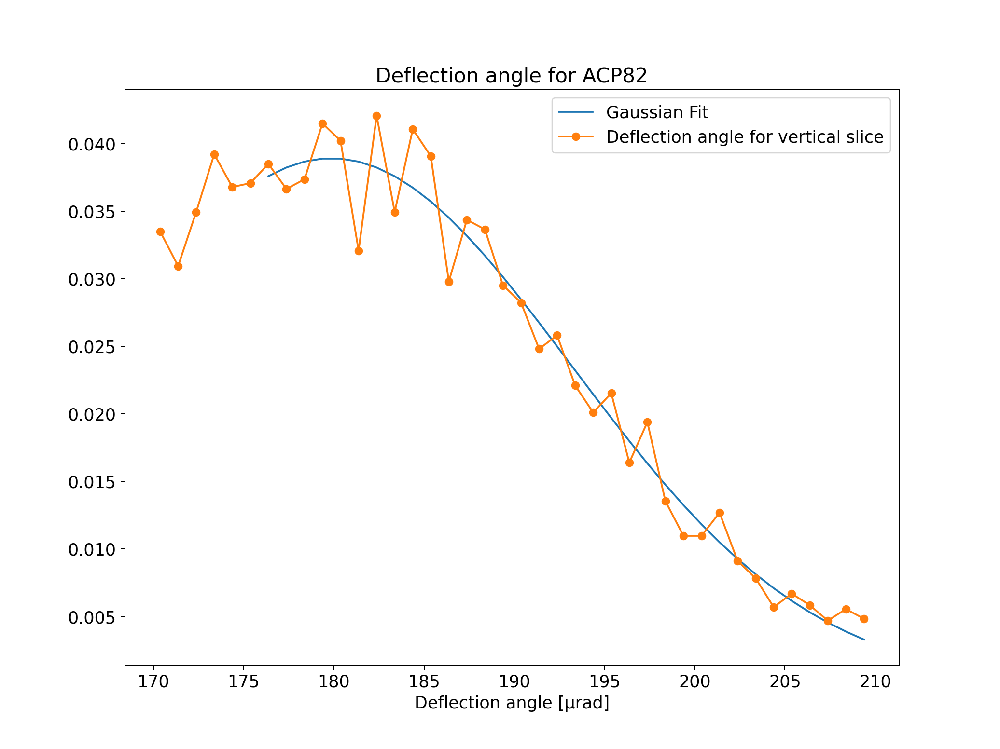

[1.79876966e+02 1.00000000e+01 3.44230265e-02]
[1.79873539e+02 1.32873096e+01 3.89088032e-02]


/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


<IPython.core.display.Javascript object>


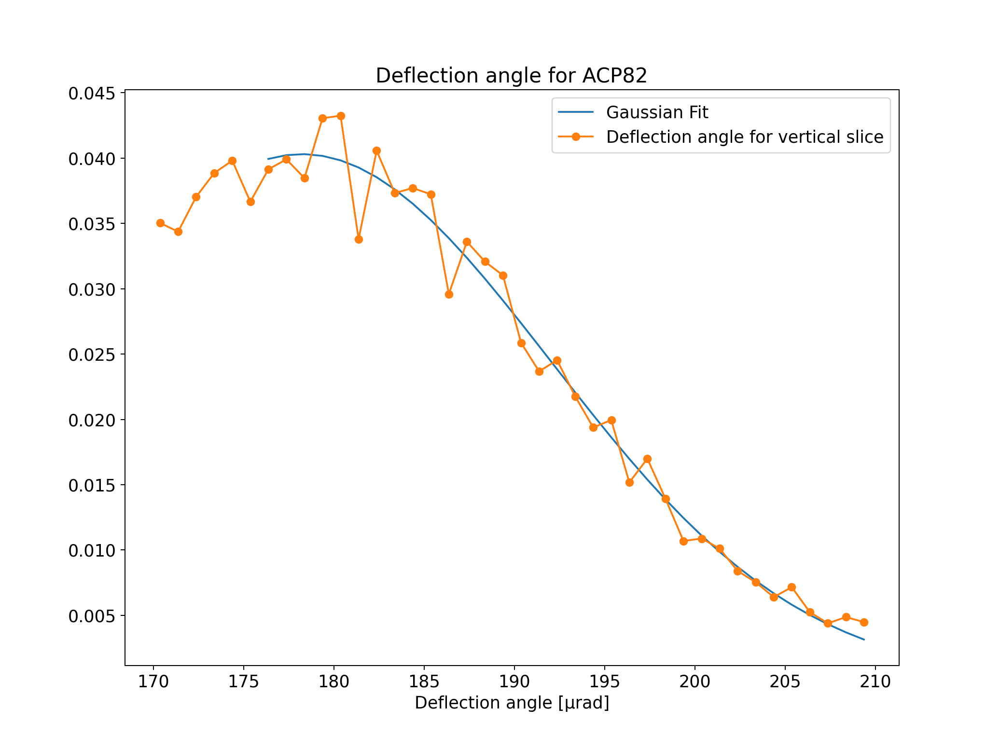

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.79873539e+02 1.00000000e+01 3.89088032e-02]
[1.78242430e+02 1.37875632e+01 4.03064498e-02]


<IPython.core.display.Javascript object>


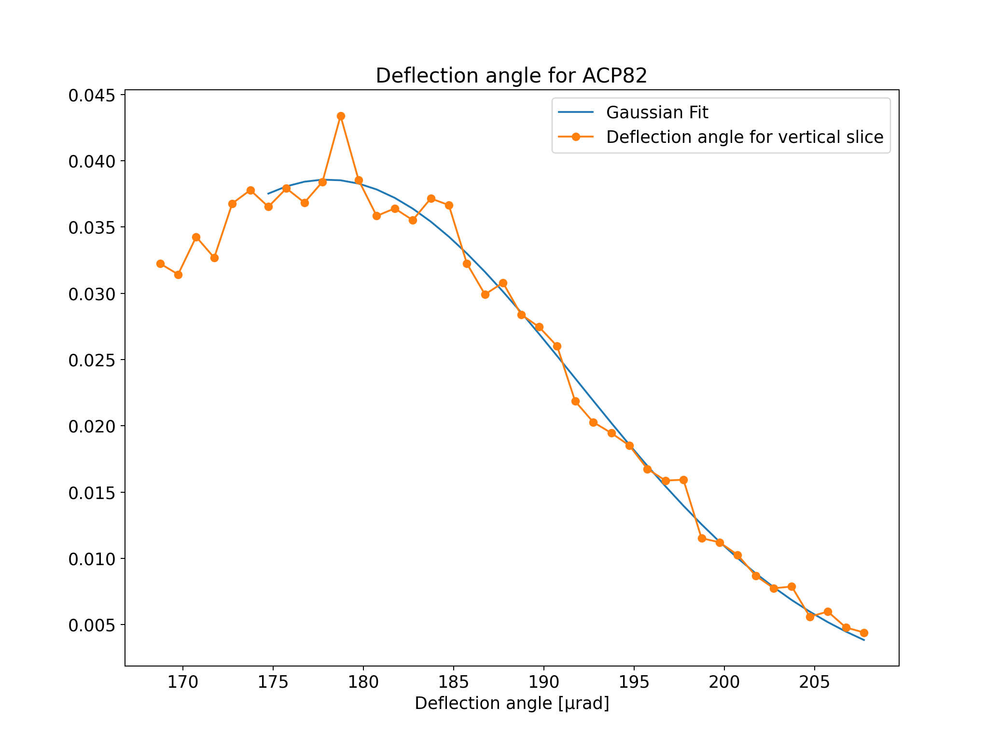

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.78242430e+02 1.00000000e+01 4.03064498e-02]
[1.78006745e+02 1.38452781e+01 3.85810576e-02]


<IPython.core.display.Javascript object>


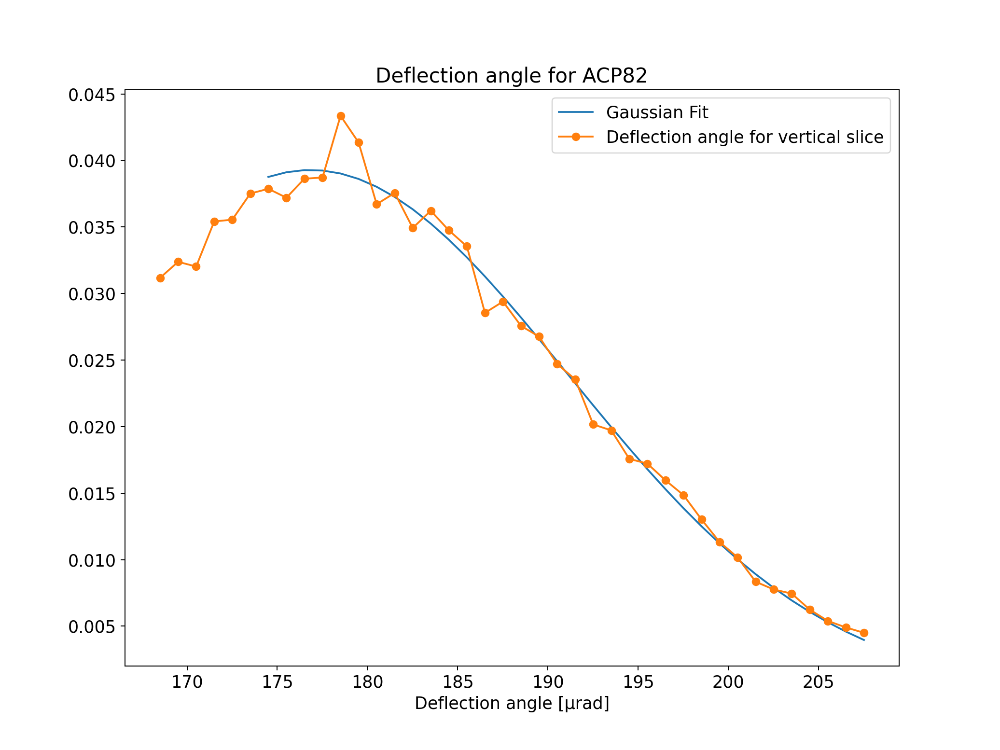

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.78006745e+02 1.00000000e+01 3.85810576e-02]
[1.76845375e+02 1.43173069e+01 3.92817480e-02]


<IPython.core.display.Javascript object>


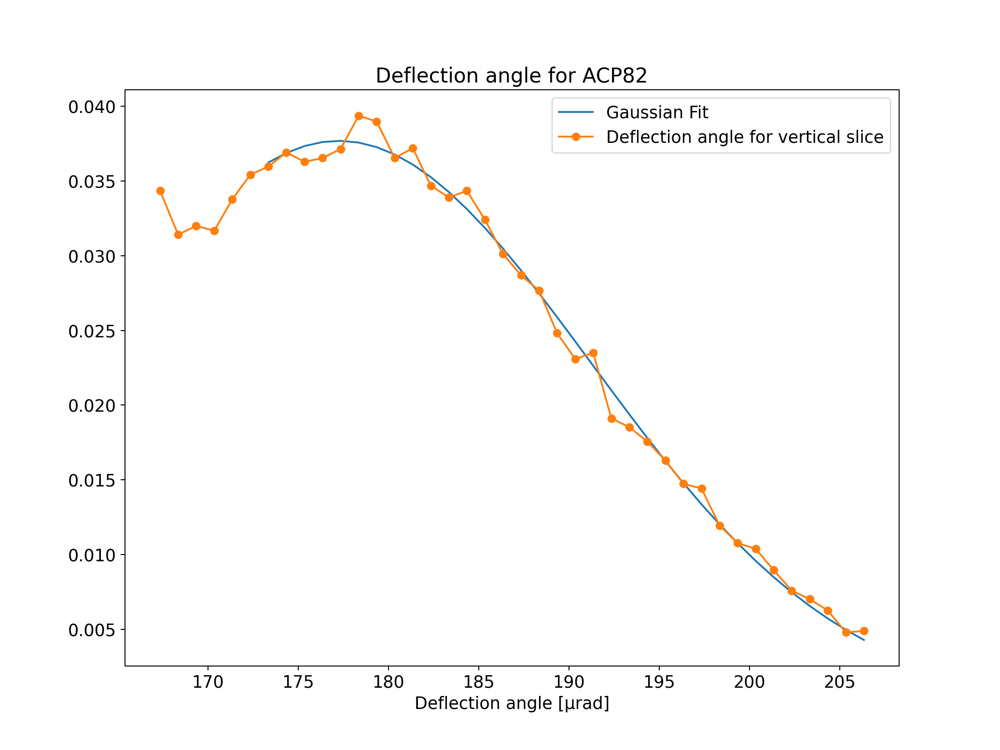

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.76845375e+02 1.00000000e+01 3.92817480e-02]
[1.77255194e+02 1.39539553e+01 3.76836091e-02]


<IPython.core.display.Javascript object>


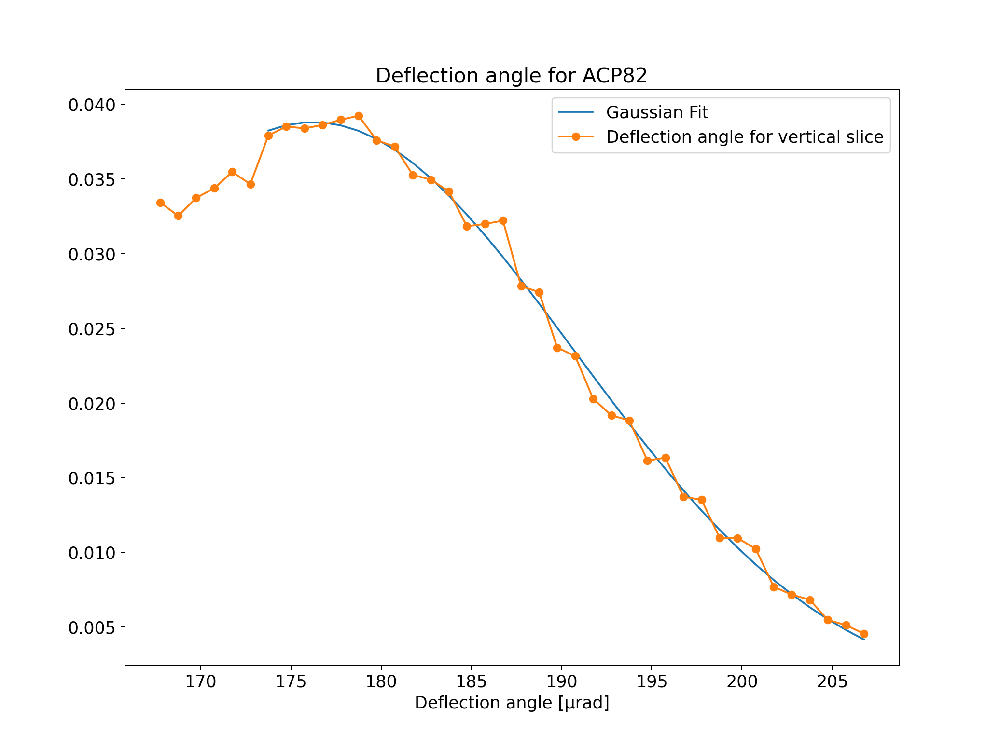

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.77255194e+02 1.00000000e+01 3.76836091e-02]
[1.76237006e+02 1.44462452e+01 3.87979187e-02]


<IPython.core.display.Javascript object>


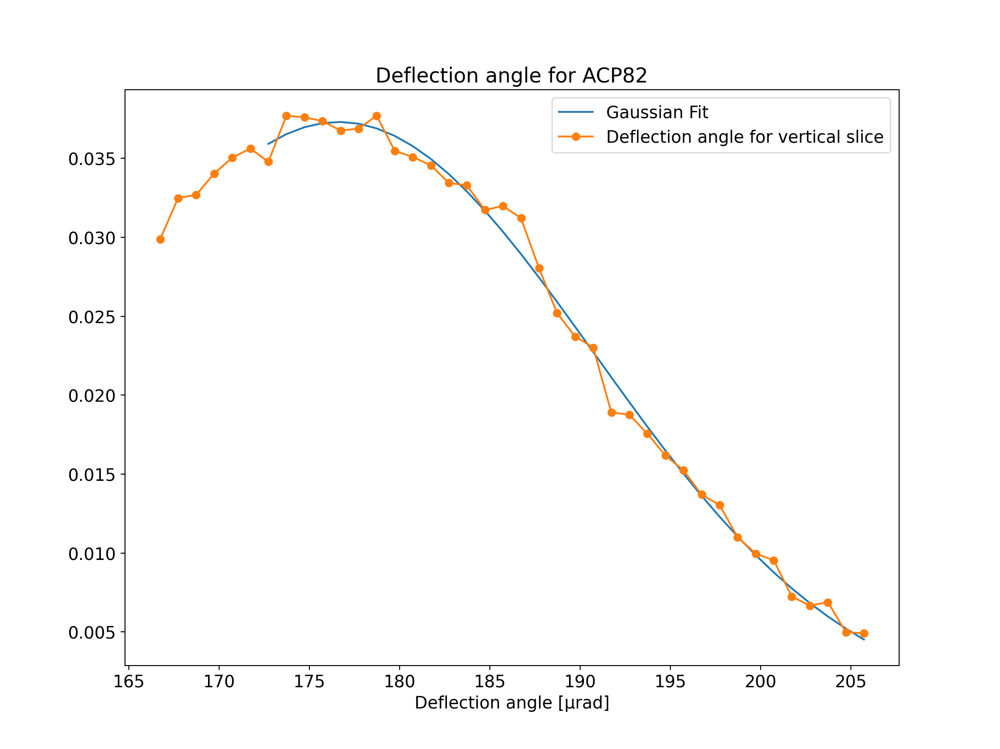

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.76237006e+02 1.00000000e+01 3.87979187e-02]
[1.76636787e+02 1.41673830e+01 3.73075403e-02]


<IPython.core.display.Javascript object>


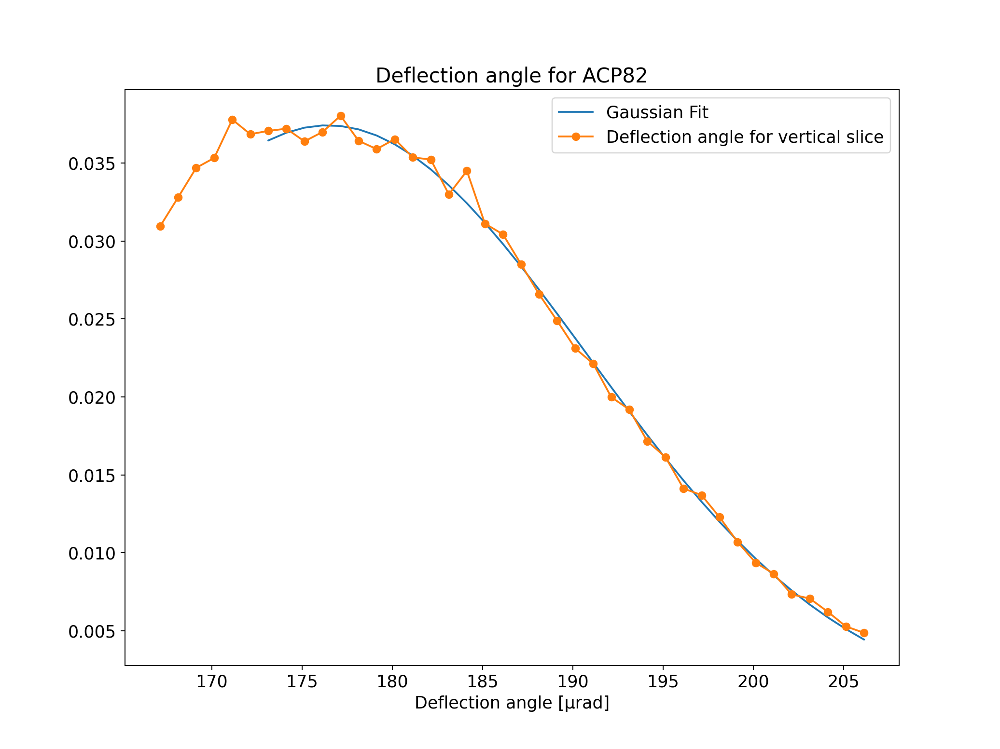

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.76636787e+02 1.00000000e+01 3.73075403e-02]
[1.76435337e+02 1.43804828e+01 3.74284183e-02]


<IPython.core.display.Javascript object>


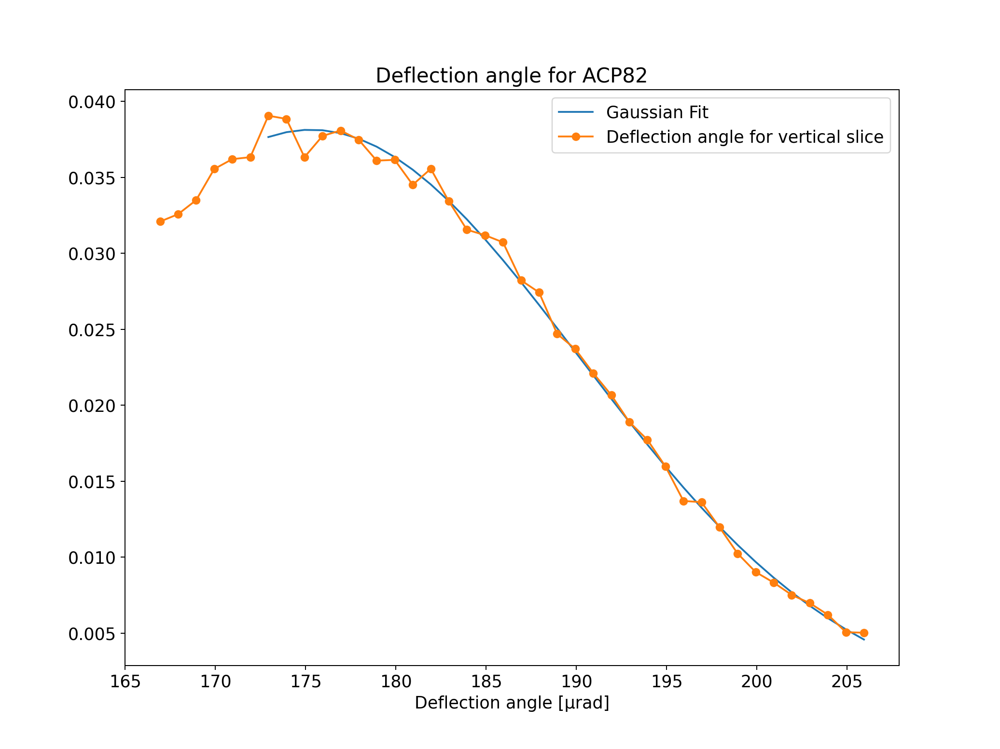

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.76435337e+02 1.00000000e+01 3.74284183e-02]
[1.75308760e+02 1.48800991e+01 3.81271219e-02]


<IPython.core.display.Javascript object>


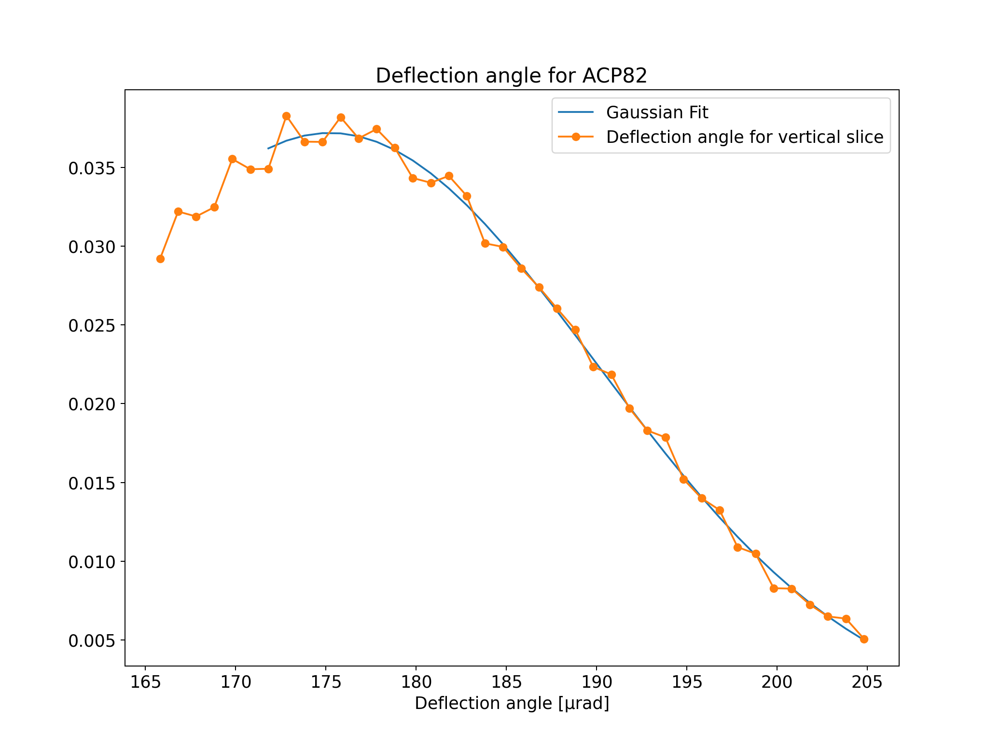

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.75308760e+02 1.00000000e+01 3.81271219e-02]
[1.75226082e+02 1.47606687e+01 3.72025591e-02]


<IPython.core.display.Javascript object>


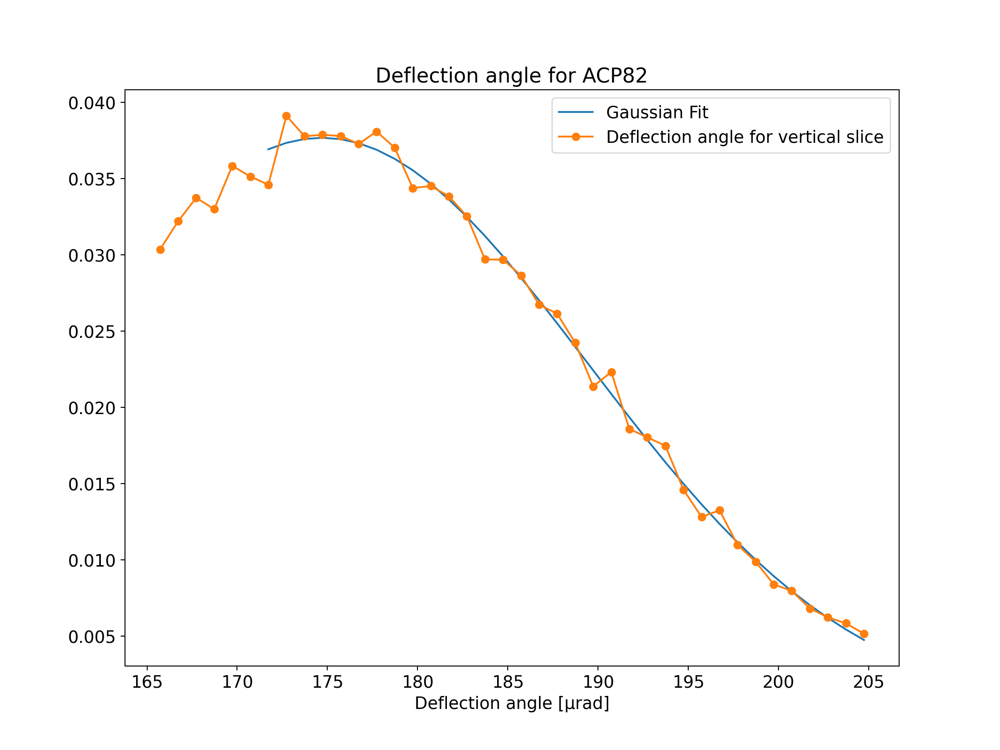

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.75226082e+02 1.00000000e+01 3.72025591e-02]
[1.74694053e+02 1.47559658e+01 3.76774381e-02]


<IPython.core.display.Javascript object>


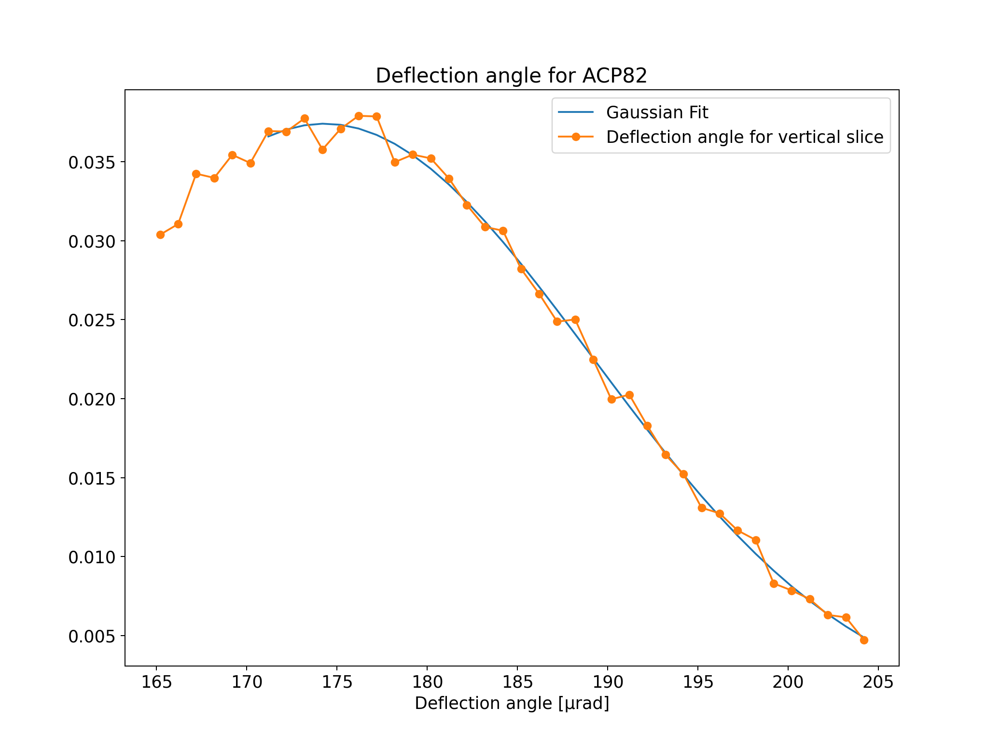

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.74694053e+02 1.00000000e+01 3.76774381e-02]
[1.74291866e+02 1.48137001e+01 3.74038911e-02]


<IPython.core.display.Javascript object>


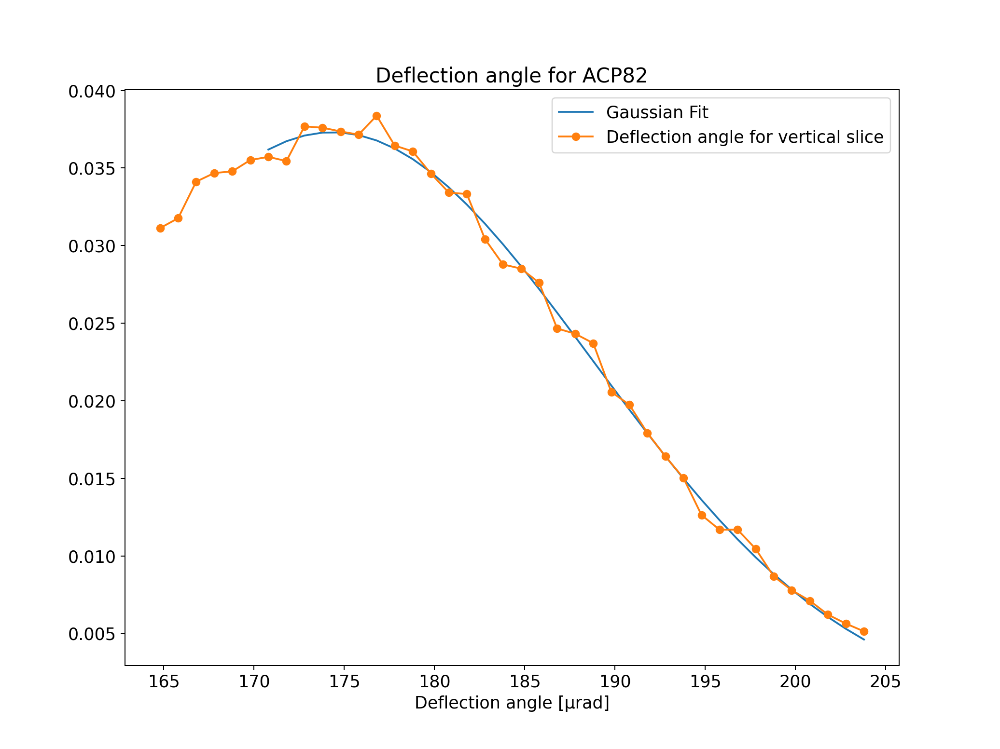

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.74291866e+02 1.00000000e+01 3.74038911e-02]
[1.74347559e+02 1.43949263e+01 3.73133822e-02]


/var/folders/kc/46w6mj1x0h3807l6v8vm8z_c0000gn/T/ipykernel_78560/2083071371.py:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = pl.subplots()


<IPython.core.display.Javascript object>


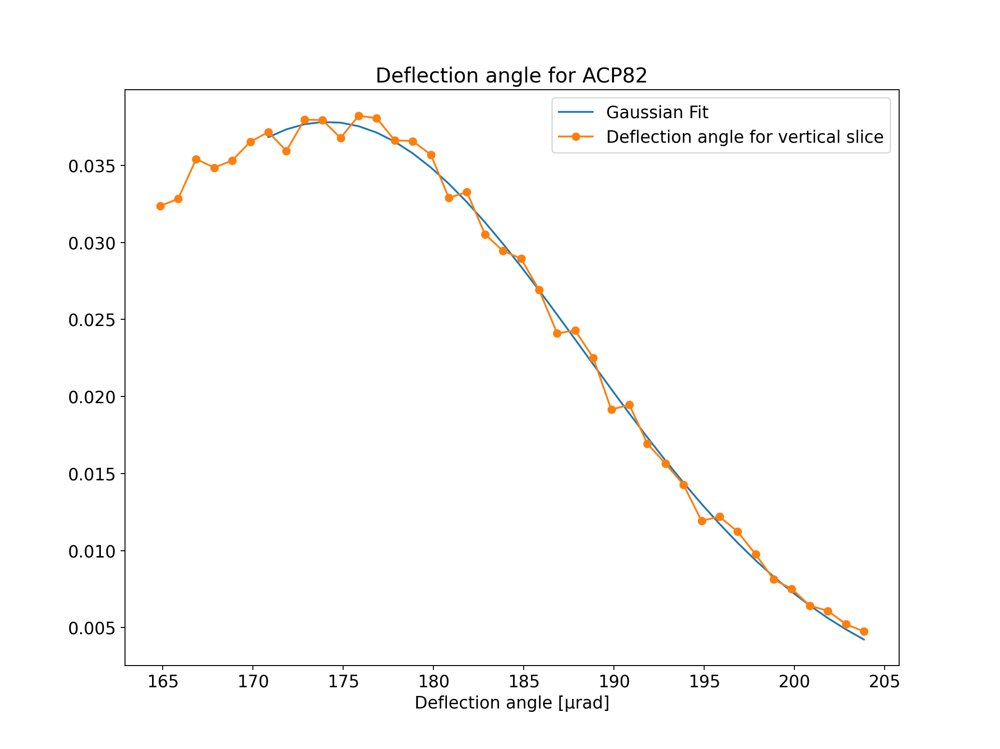

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.74347559e+02 1.00000000e+01 3.73133822e-02]
[1.74120044e+02 1.41993379e+01 3.78237159e-02]


<IPython.core.display.Javascript object>


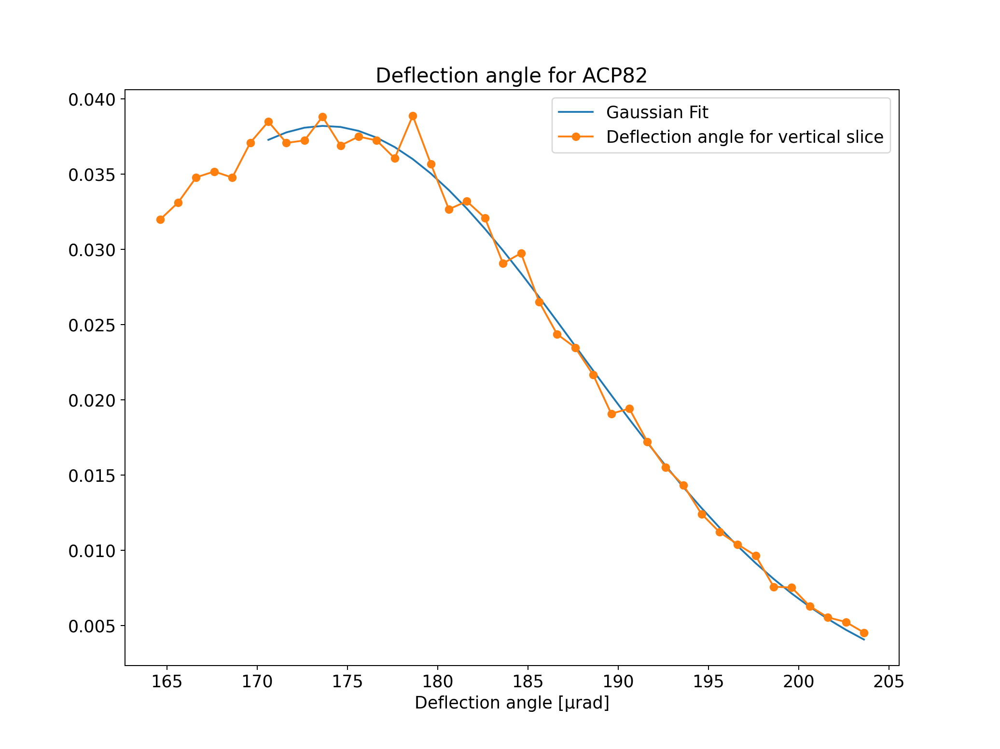

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.74120044e+02 1.00000000e+01 3.78237159e-02]
[1.73749078e+02 1.41216008e+01 3.82209171e-02]


<IPython.core.display.Javascript object>


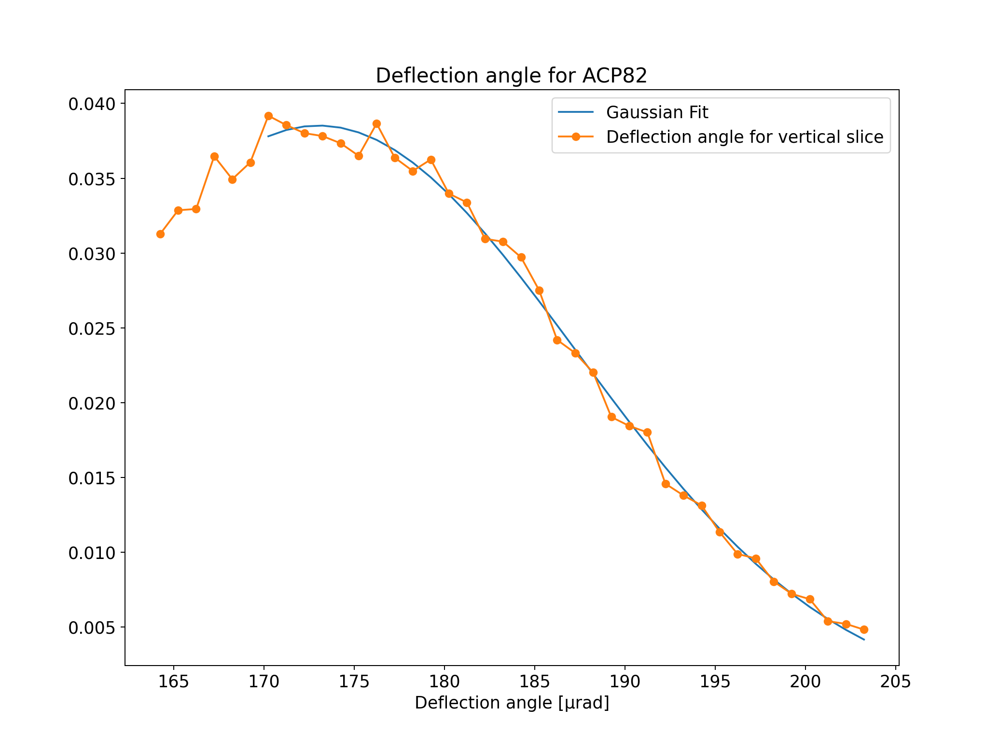

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.73749078e+02 1.00000000e+01 3.82209171e-02]
[1.73029551e+02 1.43319593e+01 3.85206679e-02]


<IPython.core.display.Javascript object>


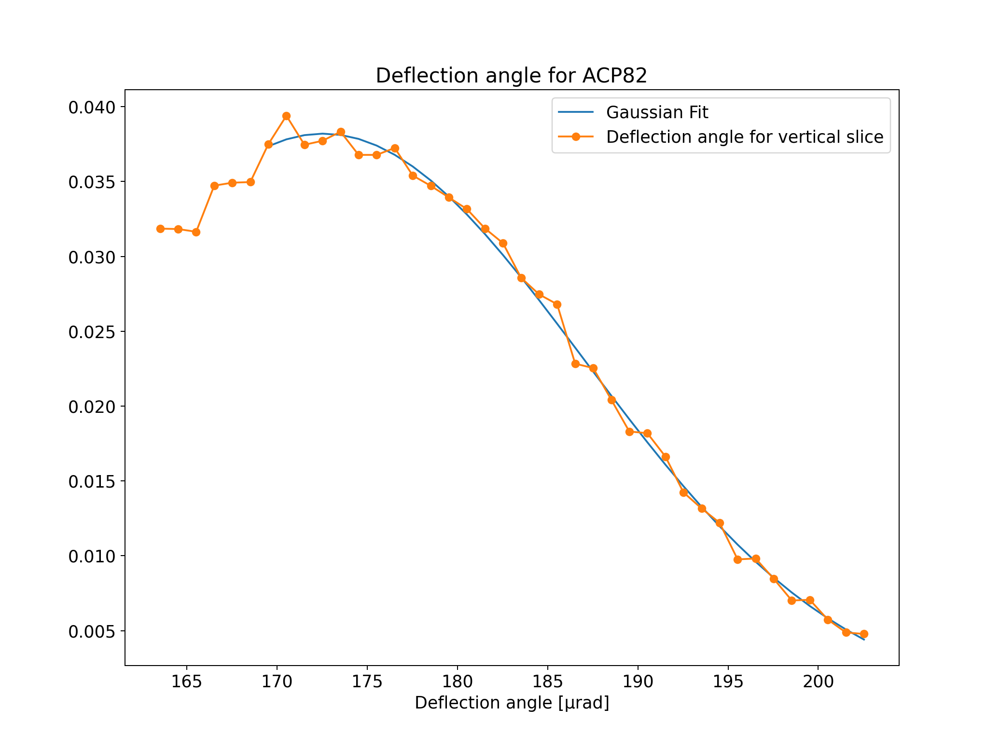

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.73029551e+02 1.00000000e+01 3.85206679e-02]
[1.72570330e+02 1.44183154e+01 3.81963757e-02]


<IPython.core.display.Javascript object>


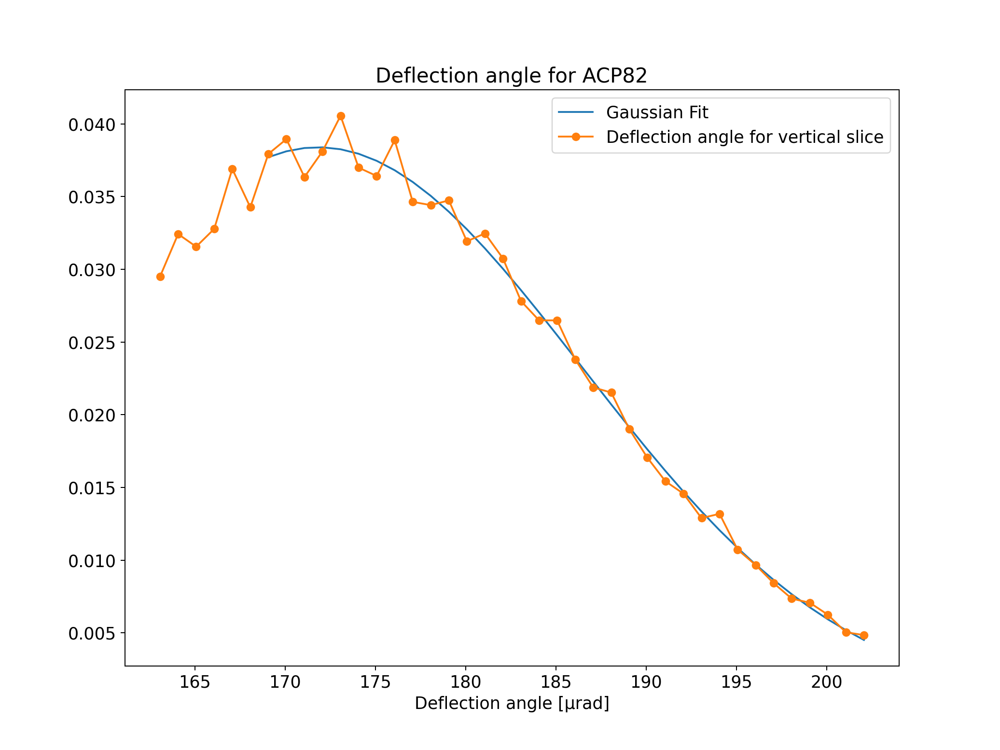

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.72570330e+02 1.00000000e+01 3.81963757e-02]
[1.71832868e+02 1.46097001e+01 3.83921566e-02]


<IPython.core.display.Javascript object>


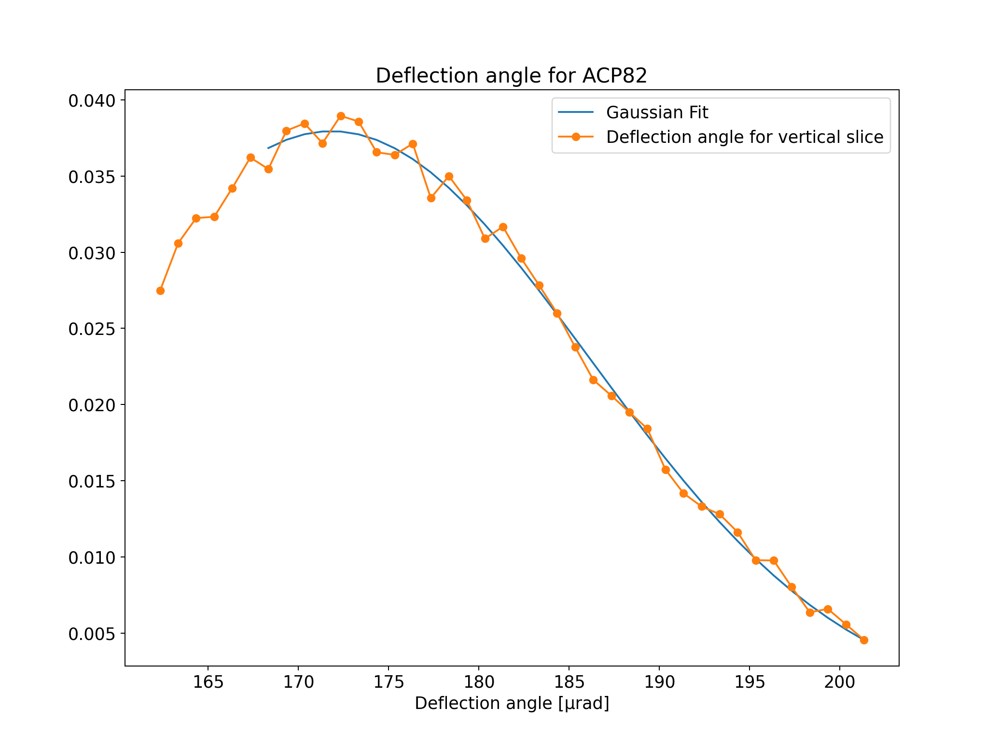

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.71832868e+02 1.00000000e+01 3.83921566e-02]
[1.71823345e+02 1.43247209e+01 3.79520115e-02]


<IPython.core.display.Javascript object>


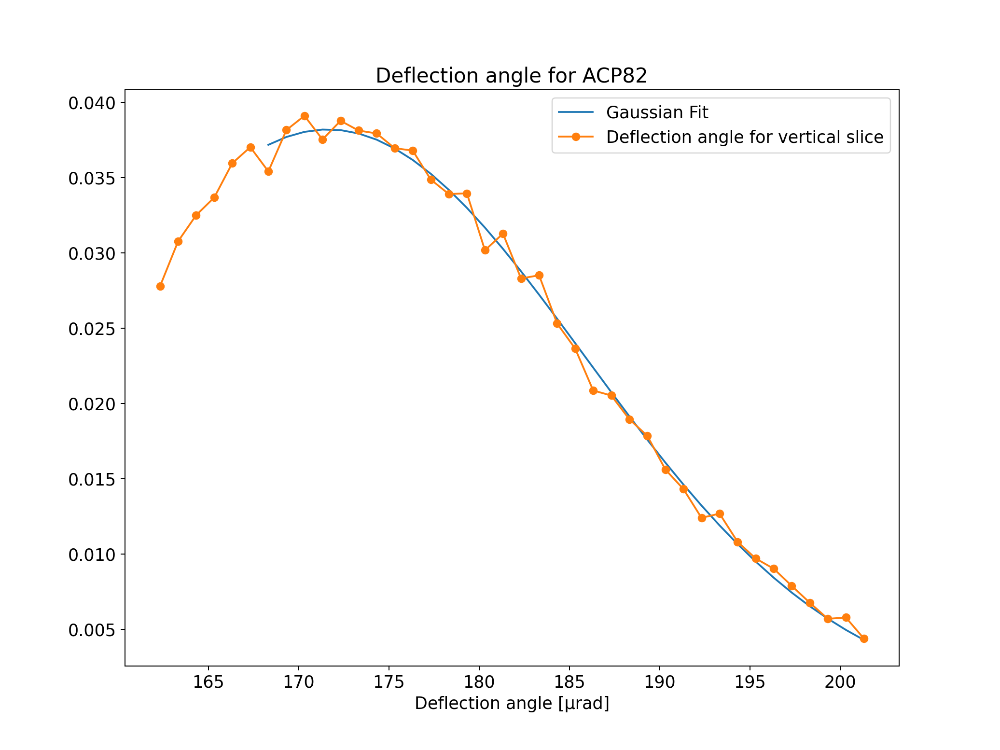

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.71823345e+02 1.00000000e+01 3.79520115e-02]
[1.71631194e+02 1.42076395e+01 3.82047691e-02]


<IPython.core.display.Javascript object>


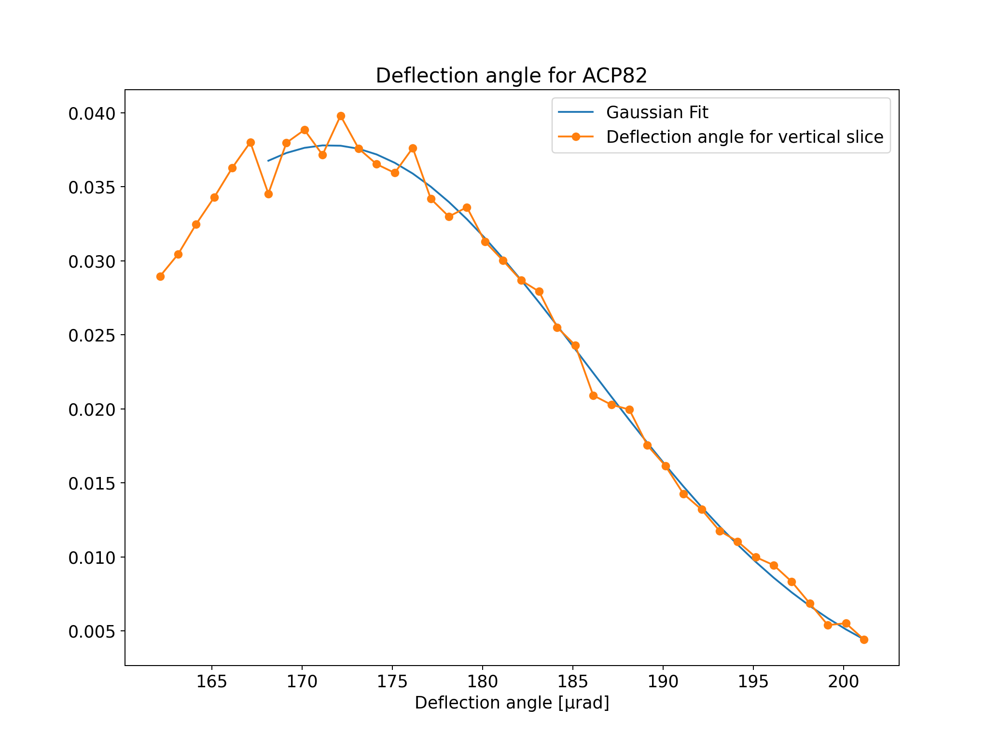

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.71631194e+02 1.00000000e+01 3.82047691e-02]
[1.71521361e+02 1.42942890e+01 3.78105491e-02]


<IPython.core.display.Javascript object>


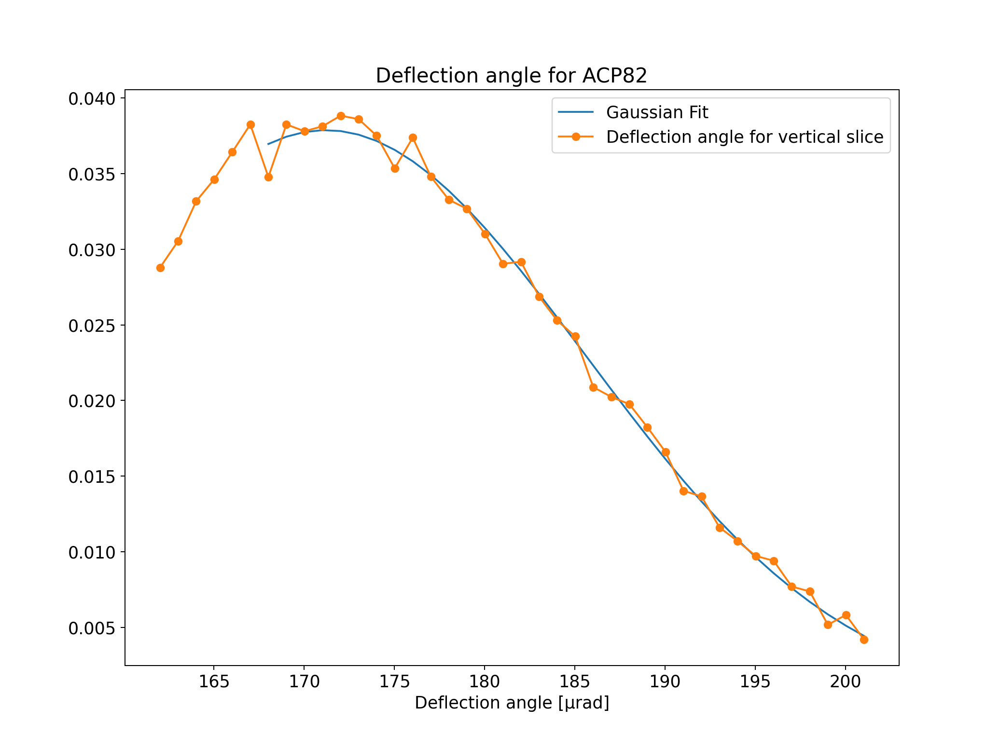

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.71521361e+02 1.00000000e+01 3.78105491e-02]
[1.71207008e+02 1.44021176e+01 3.78741945e-02]


<IPython.core.display.Javascript object>


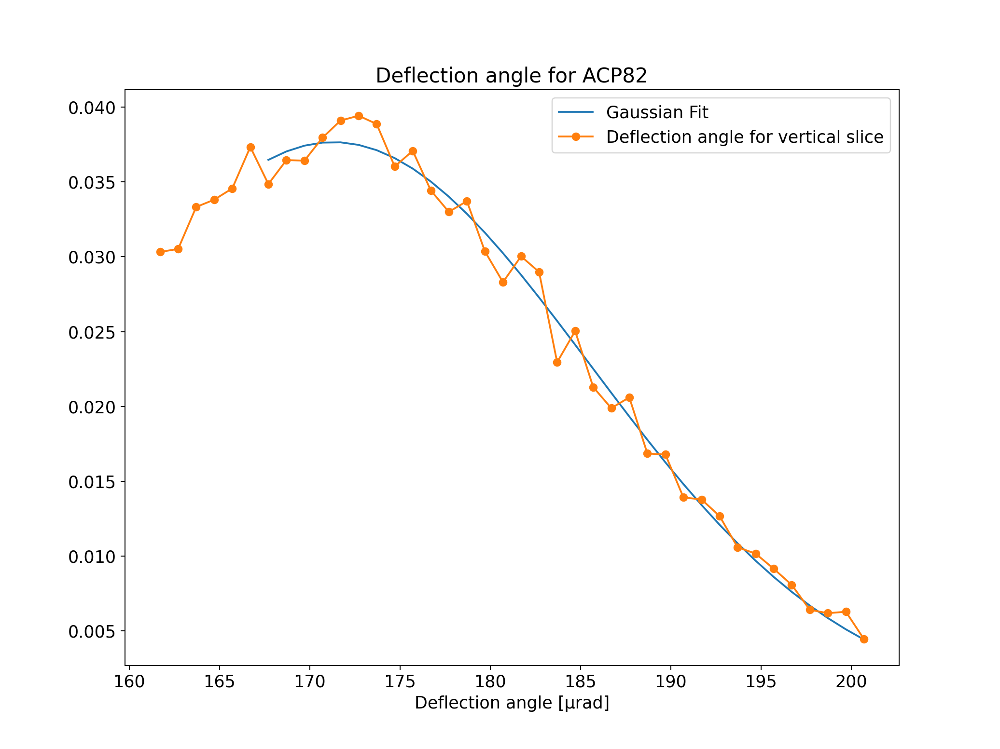

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.71207008e+02 1.00000000e+01 3.78741945e-02]
[1.71299920e+02 1.41970747e+01 3.76697883e-02]


<IPython.core.display.Javascript object>


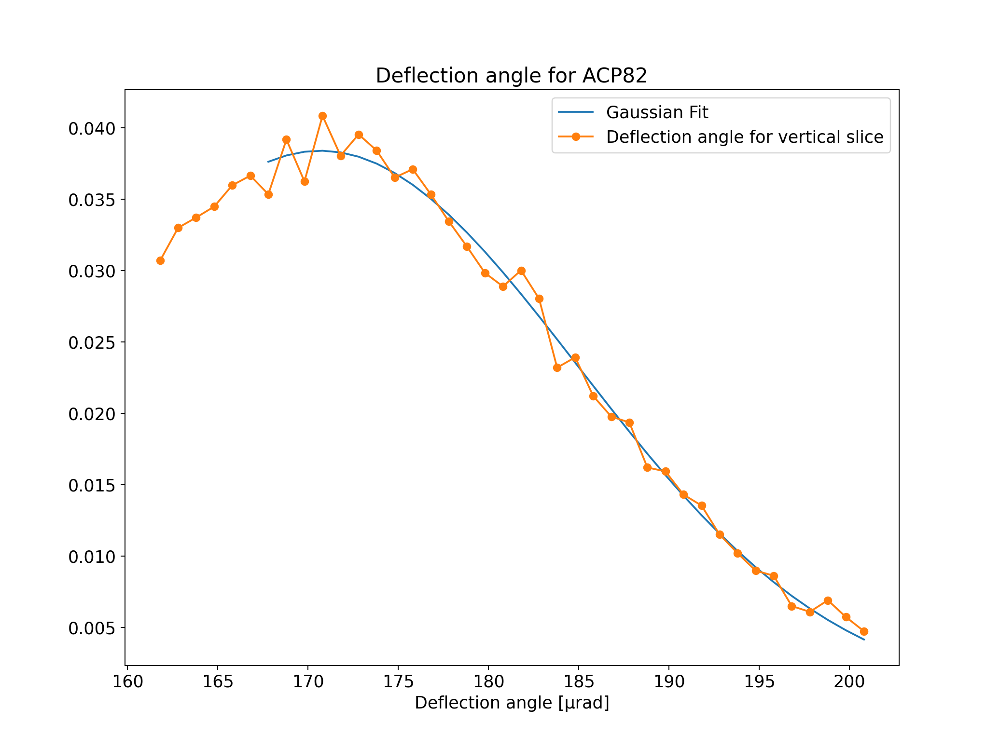

[1.71299920e+02 1.00000000e+01 3.76697883e-02]
[1.70681453e+02 1.42807509e+01 3.84073922e-02]


/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


<IPython.core.display.Javascript object>


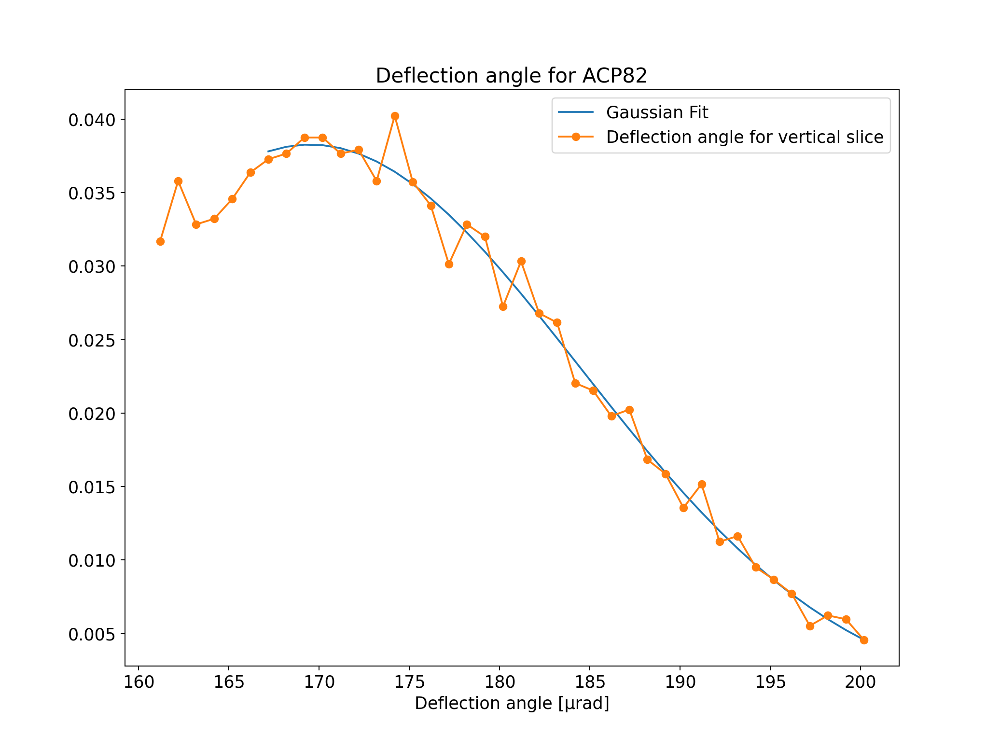

[1.70681453e+02 1.00000000e+01 3.84073922e-02]
[1.69501340e+02 1.48820211e+01 3.82704344e-02]


/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


<IPython.core.display.Javascript object>


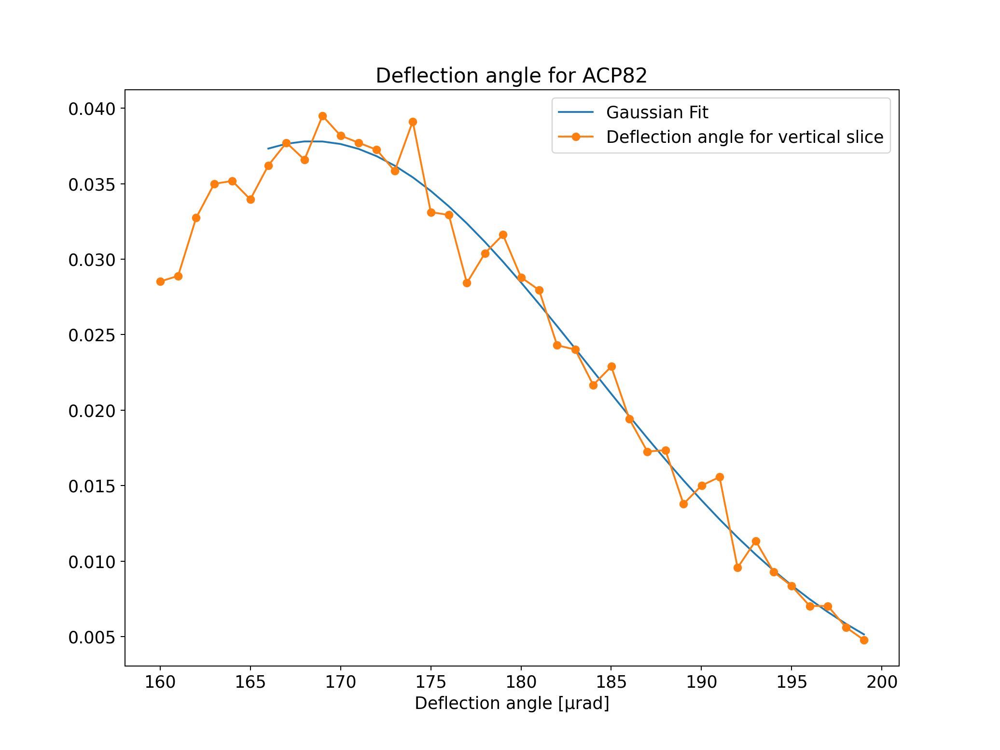

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.69501340e+02 1.00000000e+01 3.82704344e-02]
[1.68471246e+02 1.52920388e+01 3.78172514e-02]


<IPython.core.display.Javascript object>


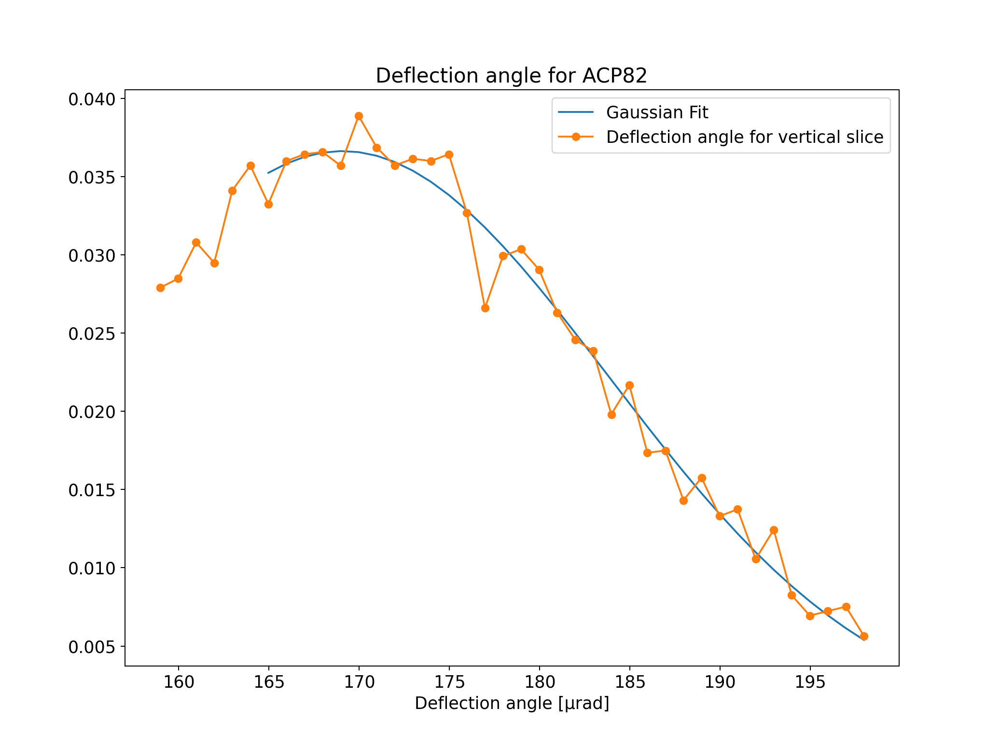

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.68471246e+02 1.00000000e+01 3.78172514e-02]
[1.69079230e+02 1.47540908e+01 3.66404426e-02]


<IPython.core.display.Javascript object>


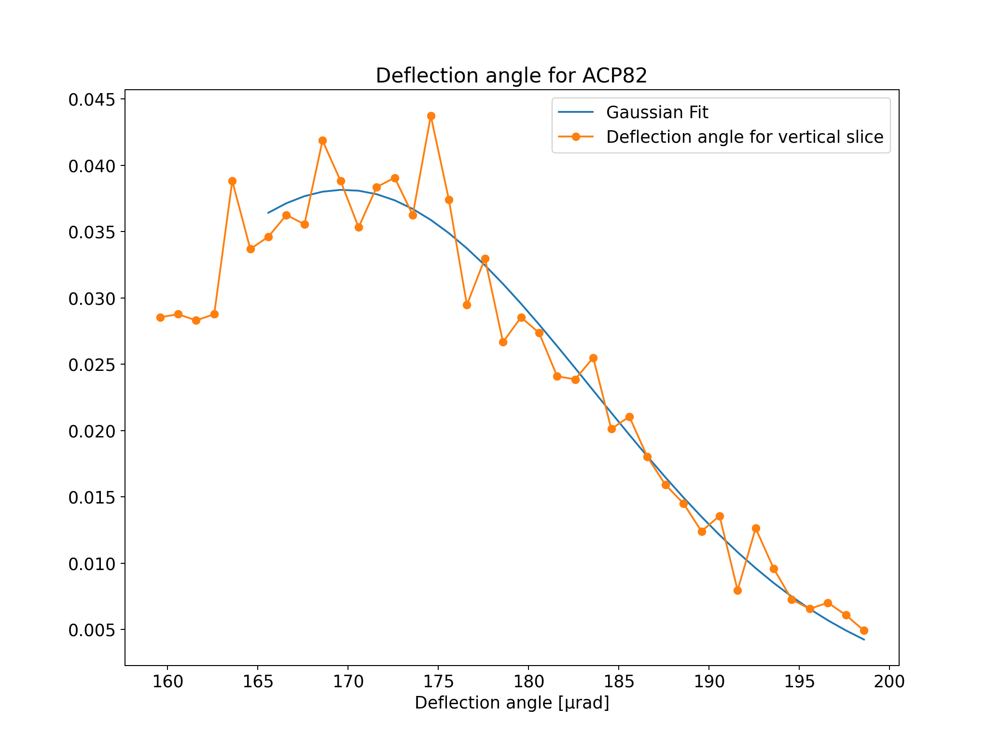

/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[1.69079230e+02 1.00000000e+01 3.66404426e-02]
[1.69764947e+02 1.37438413e+01 3.81446480e-02]


<IPython.core.display.Javascript object>


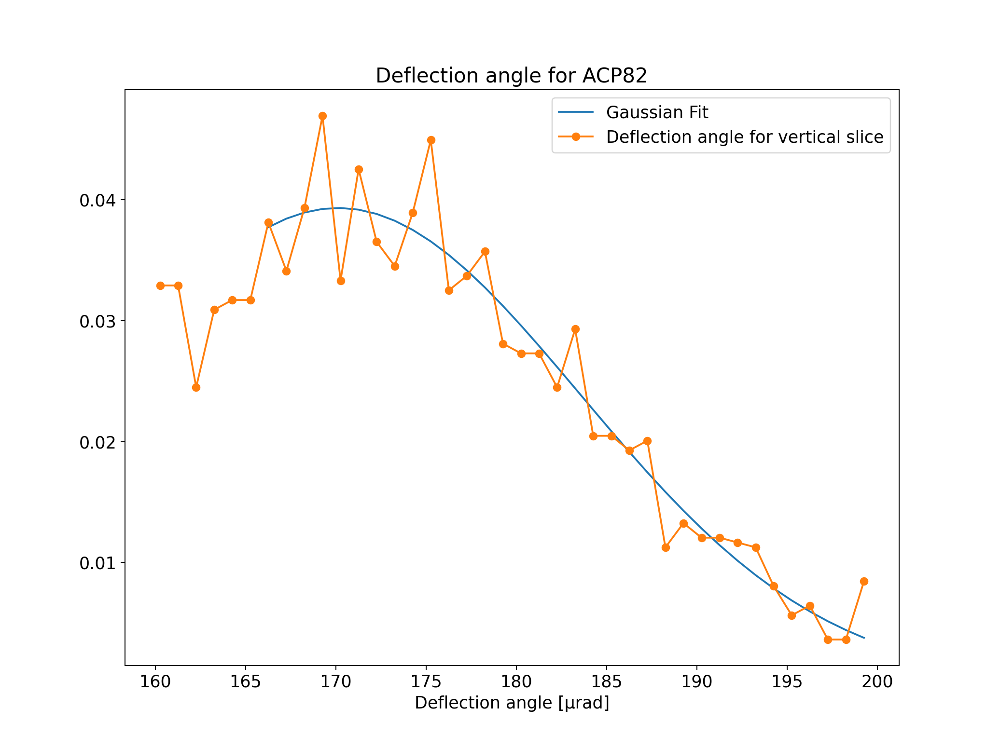

[1.69764947e+02 1.00000000e+01 3.81446480e-02]
[1.70129591e+02 1.34415681e+01 3.93334458e-02]


/Users/admin/mambaforge/lib/python3.9/site-packages/scipy/optimize/minpack.py:833: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


[179.8769656751217,
 179.87353934314038,
 178.24243014721324,
 178.00674529516584,
 176.84537491631485,
 177.2551938828863,
 176.23700643189937,
 176.6367871307235,
 176.43533705430926,
 175.3087602314779,
 175.22608246618063,
 174.69405282972036,
 174.29186563910983,
 174.34755911865534,
 174.12004414875344,
 173.74907784846488,
 173.02955068781935,
 172.5703302524276,
 171.83286799441305,
 171.8233452349273,
 171.63119392772066,
 171.52136095609922,
 171.2070076288452,
 171.29991972963612,
 170.68145318803968,
 169.501339723389,
 168.47124575241187,
 169.07922988190361,
 169.76494742599797,
 170.12959054341337]

In [8]:
#21/20
n_plots = 30
fig, ax = pl.subplots()

maxes = []
centers_y = []
yrange = np.linspace(-5,5,n_plots+1)

for i,j in zip(yrange, range(n_plots)):
    centers = (yrange[j]+yrange[j+1])/2
    centers_y.append(centers)
    
    func(-2,2,i,i+1,mode_bins,func.par_o[0],func.par_o[2])
    maxes.append(func.par_o[0])
    
maxes
#centers_y

<IPython.core.display.Javascript object>


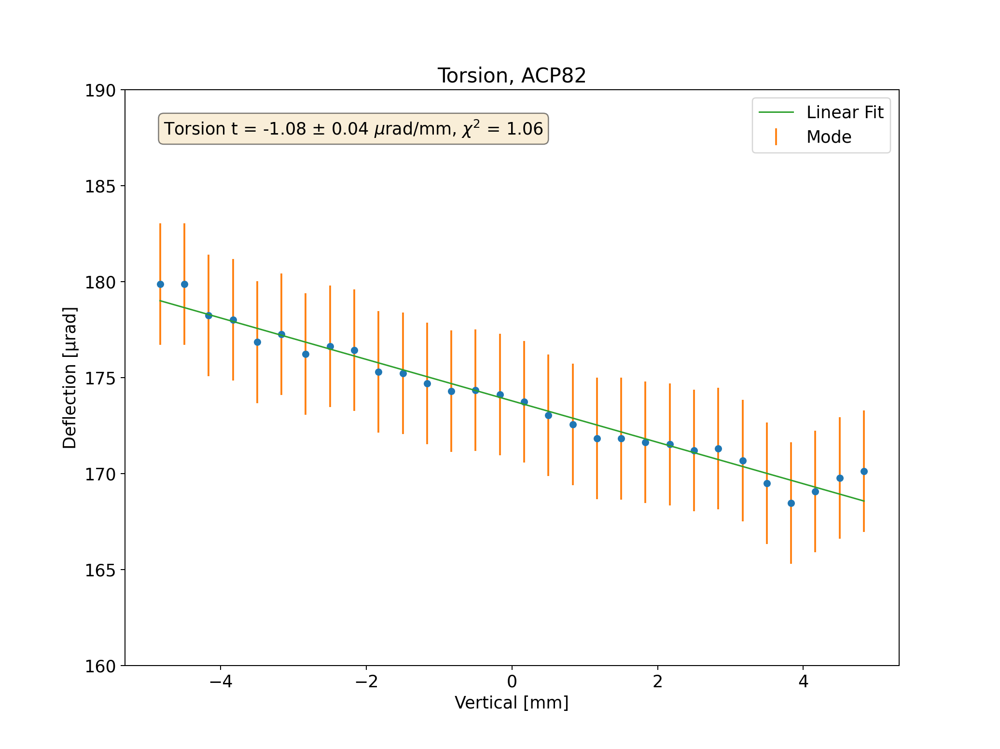

[173.7896735   -1.07881592]
[[1.17853303e-02 4.60949384e-20]
 [4.60949384e-20 1.41581298e-03]]
chi2 =  1.0606797219619115


Text(0.05, 0.95, 'Torsion t = -1.08 $\\pm$ 0.04 $\\mu$rad/mm, $\\chi^2$ = 1.06')

In [9]:
fig, ax = pl.subplots()
ax.plot(centers_y,maxes,'o',markersize=5)
ax.set_xlabel('Vertical [mm]')
ax.set_ylabel('Deflection [µrad]')

error_bin = (centers_y[1]-centers_y[0])/2
error_bin = np.sqrt(np.var(maxes))

pl.errorbar(x=centers_y, y=maxes, yerr=error_bin, linestyle='none',label='Mode')
param = (170,-3.0)
par, cov = curve_fit(linear,centers_y,maxes,p0=param)
print(par)
print(cov)
pl.plot(centers_y, linear(np.asarray(centers_y), par[0], par[1]), label = 'Linear Fit',linewidth=1.2)
pl.ylim(160,190)
pl.title('Torsion, ACP82')
pl.legend()

chi2 = sum((maxes-linear(np.asarray(centers_y),par[0], par[1]))**2)/(len(maxes)-2)*3

print('chi2 = ', chi2)#/len(d_f)


t_err = np.sqrt(np.diag(cov))[1]
t = par[1]

textstr = '\n'.join((
    r'Torsion t = %.2f $\pm$ %.2f $\mu$rad/mm, $\chi^2$ = %.2f' % (t, t_err,chi2),))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)


In [10]:
maxes

[179.8769656751217,
 179.87353934314038,
 178.24243014721324,
 178.00674529516584,
 176.84537491631485,
 177.2551938828863,
 176.23700643189937,
 176.6367871307235,
 176.43533705430926,
 175.3087602314779,
 175.22608246618063,
 174.69405282972036,
 174.29186563910983,
 174.34755911865534,
 174.12004414875344,
 173.74907784846488,
 173.02955068781935,
 172.5703302524276,
 171.83286799441305,
 171.8233452349273,
 171.63119392772066,
 171.52136095609922,
 171.2070076288452,
 171.29991972963612,
 170.68145318803968,
 169.501339723389,
 168.47124575241187,
 169.07922988190361,
 169.76494742599797,
 170.12959054341337]

In [11]:
centers_y[1]-centers_y[0]
centers_y[2]-centers_y[1]
(centers_y[1]-centers_y[0])/2

0.16666666666666696

In [12]:
par[1]
np.sqrt(np.diag(cov))[1]

0.0376272903335568

In [13]:
torsion = data_1.loc[(data_1['defl_x']>140.) & (data_1['defl_x']<210.) &  (data_1['d0_y']<2) & (data_1['d0_y']>-2) & (data_1['d0_x']<0.5) & (data_1['d0_x']>-0.5)]
torsion['thetaIn_corr'] = torsion['thetaIn_x'] + (t * torsion['d0_y'])

/var/folders/kc/46w6mj1x0h3807l6v8vm8z_c0000gn/T/ipykernel_78560/4239346455.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  torsion['thetaIn_corr'] = torsion['thetaIn_x'] + (t * torsion['d0_y'])


/var/folders/kc/46w6mj1x0h3807l6v8vm8z_c0000gn/T/ipykernel_78560/1512591096.py:8: RuntimeWarning: invalid value encountered in sqrt
  off_st_dev = np.sqrt(off2 - off**2)


<IPython.core.display.Javascript object>


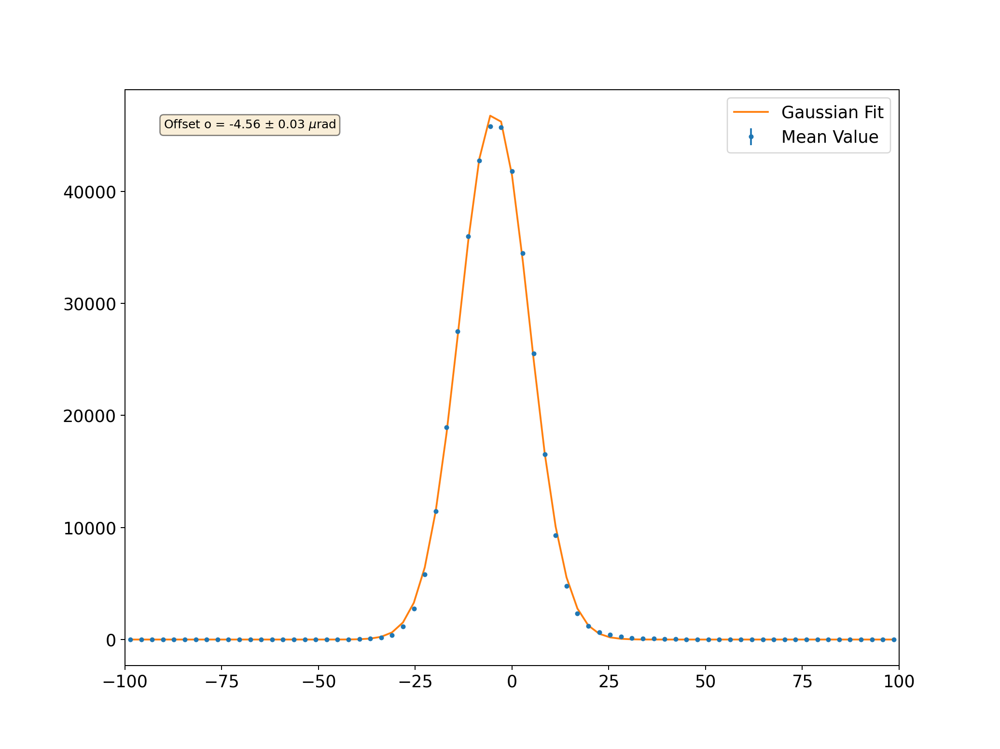

Crystal Torsion t = -1.08 $\pm$ 0.04 $\mu$rad/mm and Offset o = -4.56 $\pm$ 0.03 $\murad$ 
The o and o_err being called: -4.56, 0.03


In [14]:
####################### Offset #######################

off_result = scipy.stats.binned_statistic(torsion['thetaIn_corr'], [torsion['defl_x'], torsion['defl_x']**2], bins=71, 
                                             range=(-100.,100.), 
                                            statistic='count')

off, off2 = off_result.statistic
off_st_dev = np.sqrt(off2 - off**2)
bin_edges_off = off_result.bin_edges
bin_centers_off = (bin_edges_off[:-1] + bin_edges_off[1:])/2.

#print (bin_centers,means)

fig1, ax1 = pl.subplots()


pl.errorbar(x=bin_centers_off, y=off, yerr=off_st_dev, linestyle='none', marker='.', label='Mean Value')
pl.xlim(-100,100)
param_o = (-10,30,1)
par_o, cov_o = curve_fit(gaussian,bin_centers_off,off,param_o)

pl.plot(bin_centers_off, gaussian(bin_centers_off,par_o[0],par_o[1],par_o[2]),label='Gaussian Fit')
pl.legend()


o_err = np.sqrt(np.diag(cov_o))[0]
o = par_o[0]

textstr = '\n'.join((
    r'Offset o = %.2f $\pm$ %.2f $\mu$rad' % (o, o_err),))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax1.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,
        verticalalignment='top', bbox=props)

print(r'Crystal Torsion t = {:2.2f} $\pm$ {:2.2f} $\mu$rad/mm and Offset o = {:2.2f} $\pm$ {:2.2f} $\murad$ '.format(t,t_err,o,o_err))
print(f'The o and o_err being called: {o:.2f}, {o_err:.2f}')

In [15]:
####################### Final dataframe for analysis 
####################### with impact angle correction

data =  data_1.loc[(data_1['d0_y']<2) & (data_1['d0_y']>-2) & (data_1['d0_x']<0.5) & (data_1['d0_x']>-0.5)]#(data_1['d0_x']<cut.max()) & (data_1['d0_x']>cut.min())]

data['thetaIn_corr'] = data['thetaIn_x'] + (t * data['d0_y'] - o)


/var/folders/kc/46w6mj1x0h3807l6v8vm8z_c0000gn/T/ipykernel_78560/2036638066.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['thetaIn_corr'] = data['thetaIn_x'] + (t * data['d0_y'] - o)


In [16]:
#off_result = scipy.stats.binned_statistic(data['thetaIn_corr'], [data['defl_x'], data['defl_x']**2], bins=81, 
 #                                            range=(-100.,100.), 
  #                                          statistic='count')

#off, off2 = off_result.statistic
#off_st_dev = np.sqrt(off2 - off**2)
#bin_edges_off = off_result.bin_edges
#bin_centers_off = (bin_edges_off[:-1] + bin_edges_off[1:])/2.

#print (bin_centers,means)

#fig1, ax1 = pl.subplots()


#pl.errorbar(x=bin_centers_off, y=off, yerr=off_st_dev, linestyle='none', marker='.', label='Mean Value')
#pl.xlim(-100,100)
#param_o = (-10,30,1)
#par_o, cov_o = curve_fit(gaussian,bin_centers_off,off,param_o)

#pl.plot(bin_centers_off, gaussian(bin_centers_off,par_o[0],par_o[1],par_o[2]),label='Gaussian Fit')
#pl.legend()

#o_err = np.sqrt(np.diag(cov_o))[0]
#o = par_o[0]

#textstr = '\n'.join((
#    r'Offset o = %.2f $\pm$ %.2f $\mu$rad' % (o, o_err),))
#props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
#ax1.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=10,
 #       verticalalignment='top', bbox=props)

<IPython.core.display.Javascript object>


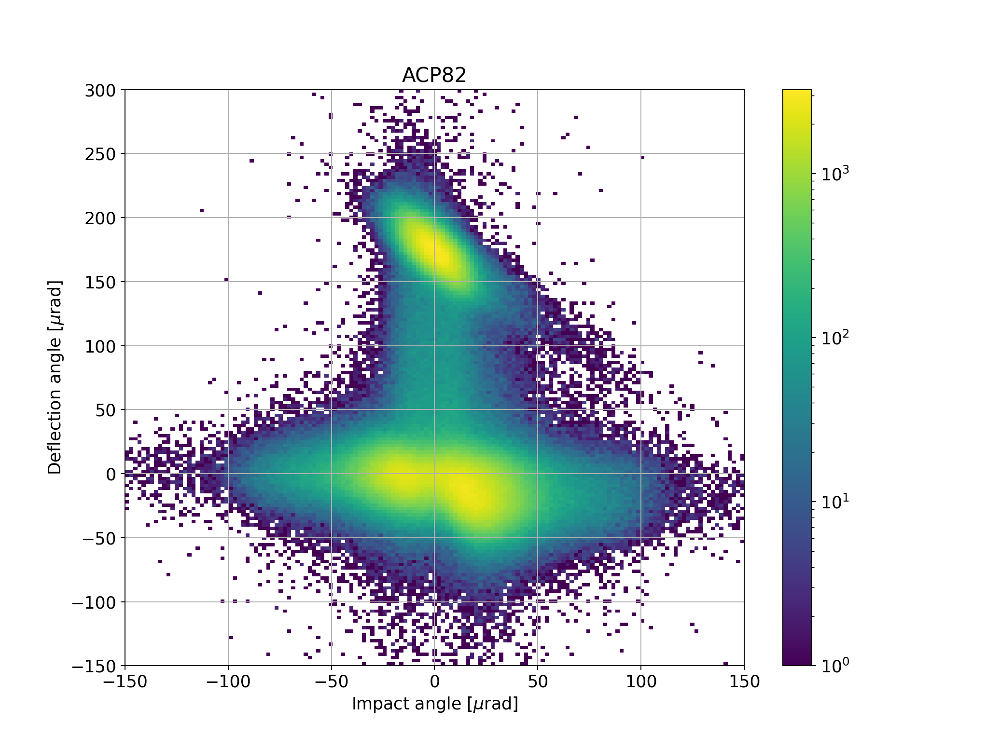

1667532.0


In [17]:
fig, ax = pl.subplots()

pl.xlabel(r'Impact angle [$\mu$rad]')
pl.ylabel(r'Deflection angle [$\mu$rad]')
pl.title('ACP82')



xbins = np.linspace(-150, 150, 150)
ybins = np.linspace(-150, 300, 175)


counts, xedges, yedges, _ = pl.hist2d(data['thetaIn_corr'],data['defl_x'], bins=(xbins, ybins), 
                                       norm=mpl.colors.LogNorm(),
                                       cmap=pl.cm.viridis)
#pl.xlim(-150,150)
#pl.ylim(-150,150)

print (np.sum(counts))
cbar = pl.colorbar() 
pl.grid()   
pl.show()

In [18]:
################### Angular cut for efficiency analysis ######################

eff_crit = data.loc[(data['thetaIn_corr']>-16) & (data['thetaIn_corr']<16)]
eff_half = data.loc[(data['thetaIn_corr']>-10) & (data['thetaIn_corr']<10)]

<IPython.core.display.Javascript object>


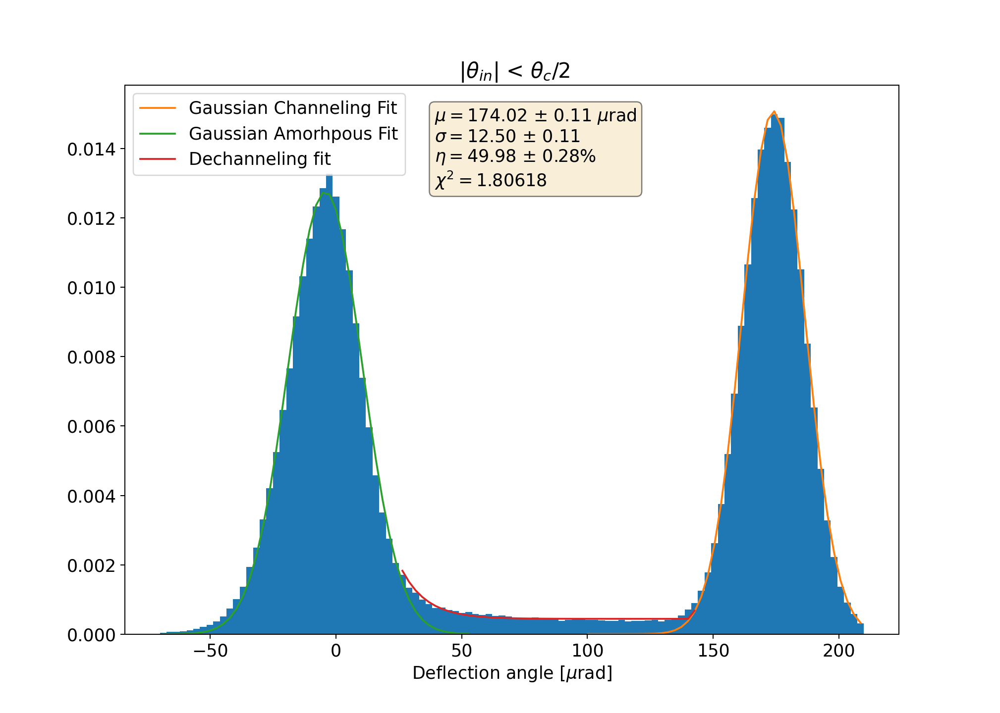

Initial bounds at AM = 10.49 and CH = 161.52

Global fit
Amorphous gaussian $\mu$ = -3.47 and $\sigma$ = 15.38
Channeling gaussian $\mu$ = 174.03 and $\sigma$ = 12.41
Dechanneling Length $L_d$ = 0.229863 mm

efficiency for full critical angle 44.93% $\pm$ 0.28%

Manual efficiency: 49.98%
1.806182050964832


In [50]:
############## analysis at half critiacl angle #############
############## initialise gaussian parameters  #############

half = np.array(eff_half['defl_x'])
#print(len(half))
fig, ax = pl.subplots()

pl.xlabel(r'Deflection angle [$\mu$rad]')
ax.set_title(r' |$\theta_{in}$| < $\theta_c$/2 ')



xmin, xmax = -70,210
lnspc = np.linspace(xmin, xmax, 107) #57,29 at 91 - 58,12 at 83... 50.51 at 114

d_h, v_h, patch  = pl.hist(half,bins=lnspc,density=True,log=False)

c_h = (v_h[:-1] + v_h[1:]) / 2
param = (-3.,14.,7000,174.,11.,10000)
par_h, e_h = curve_fit(bimodal, c_h, d_h,param)#, bounds=((-np.inf, 10, -np.inf, 10), (np.inf, 30, np.inf, 30)))

#pl.plot(c_h[:],bimodal(c_h[:],*par_h),c='r')

#####GAUSSIAN 1
param_pl = (174.0,11.,1700)
par_h_pl, e_h_pl = curve_fit(gaussian, c_h[c_h>100], d_h[c_h>100],param_pl)
pl.plot(c_h[c_h>100],gaussian(c_h[c_h>100],*par_h_pl), label = 'Gaussian Channeling Fit')

#####GAUSSIAN 2
param_pl2 = (-3,14.,11000)
par_h_pl2, e_h_pl2 = curve_fit(gaussian, c_h[c_h<54], d_h[c_h<54],param_pl2)
pl.plot(c_h[c_h<54],gaussian(c_h[c_h<54],*par_h_pl2), label = 'Gaussian Amorhpous Fit')


mean_ch = par_h[3]
sigma_ch = par_h[4]
mean_am = par_h[0]
sigma_am = par_h[1]




############## adding dechanneling #################
dech_dw = mean_am+sigma_am*1
dech_up = mean_ch-sigma_ch*1
print('Initial bounds at AM = {:2.2f} and CH = {:2.2f}\n'.format(dech_dw,dech_up))

#fig, ax = plt.subplots()
#plt.hist(half,bins=lnspc,density=True,alpha=1,log=True)
#pl.ylim(0,0.03)

#defl_cont(x,x_am,x_ch,mu1,sig1,A1,tau,A3,mu2,sig2,A2)

param_1 = (-40,125,-1.,-1.,0.0002,-10,0.001,1,1.,0.01)
par_1h, pcov1f = curve_fit(defl_cont, c_h[:], d_h[:], 
                         bounds=((dech_dw-25,dech_up-25,mean_am-20, sigma_am-5, -0.006, -0.006, 0.006,mean_ch-2, sigma_ch-2, 0), 
                                 (dech_dw+5,dech_up+5,mean_am+2, sigma_am+2, 30, 10, 10,mean_ch+2, sigma_ch+2, 1)))
#print(par_1)
pl.plot(c_h[(c_h>25)&(c_h<145)],defl_cont(c_h[(c_h>25)&(c_h<145)],*par_1h),label='Dechanneling fit')


mean_ch_h = par_h_pl[0]
sigma_ch_h = par_h_pl[1]
mean_am_h = par_h_pl2[0]
sigma_am_h = par_h_pl2[1]

mean_ch_h_err = np.sqrt(np.diag(e_h_pl))[0]
sigma_ch_h_err = np.sqrt(np.diag(e_h_pl))[1]

print('Global fit')
print(r'Amorphous gaussian $\mu$ = {:2.2f} and $\sigma$ = {:2.2f}'.format(par_1h[2],par_1h[3]))
print(r'Channeling gaussian $\mu$ = {:2.2f} and $\sigma$ = {:2.2f}'.format(par_1h[7],par_1h[8]))

dch_len_h = (par_1h[5]*1e-6*(cry_length/(mean_ch_h*1e-6)))*1e3
#print(par_1[5],(cry_length/(mean_ch_h*1e-6)))
print(r'Dechanneling Length $L_d$ = {:2.6f} mm'.format(dch_len_h))



###################### efficiency ###########################

print()
sel_half = np.array(eff_half.loc[(eff_half['defl_x']>=mean_ch_h) & (eff_half['defl_x']<=(mean_ch_h+sigma_ch_h*2))]['defl_x'])
eff_h = (len(sel_half)*2)/len(eff_half)

sel_half_plus = np.array(eff_half.loc[(eff_half['defl_x']>=mean_ch_h+mean_ch_h_err) & (eff_half['defl_x']<=(mean_ch_h+mean_ch_h_err+(sigma_ch_h+sigma_ch_h_err)*3))]['defl_x'])
sel_half_minus = np.array(eff_half.loc[(eff_half['defl_x']>=mean_ch_h-mean_ch_h_err) & (eff_half['defl_x']<=(mean_ch_h-mean_ch_h_err+(sigma_ch_h-sigma_ch_h_err)*3))]['defl_x'])
eff_h_plus = (len(sel_half_plus)*2)/len(eff_half)
eff_h_minus = (len(sel_half_minus)*2)/len(eff_half)
eff_h_error = (eff_h_minus-eff_h_plus)/2.

ef_h = 2*sum(d_h[c_h>mean_ch_h])/sum(d_h)
#ef_h = sum(d_h[c_h>100])/sum(d_h)


print(r'efficiency for full critical angle {:2.2%} $\pm$ {:2.2%}'.format(eff_h,eff_h_error ))
print(f"\nManual efficiency: {ef_h*100:.2f}%")
#eff_h = eff_h*100
#eff_h_error *=100


chisq = sum((d_h-bimodal(c_h,*par_h))**2/np.std(d_h)**2)*3
#chisq = sum((d_h[110:]-gaussian(c_h[110:],*par_h_pl))**2/np.std(d_h[110:])**2)

textstr = '\n'.join((
    r'$\mu=%.2f$ $\pm$ %.2f $\mu$rad' % (mean_ch_h ,mean_ch_h_err, ),
    r'$\sigma=%.2f$ $\pm$ %.2f' % (sigma_ch_h,sigma_ch_h_err,),
    #r'$\eta=%.2f$ $\pm$ %.2f ' % (eff_h,eff_h_error, )))
    r'$\eta={:2.2%}$ $\pm$ {:2.2%}'.format(ef_h,eff_h_error),
    r'$\chi^2=%.5f$' % (chisq),))

props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.4, 0.96, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)
print(chisq)
ax.legend(loc='upper left')


<IPython.core.display.Javascript object>


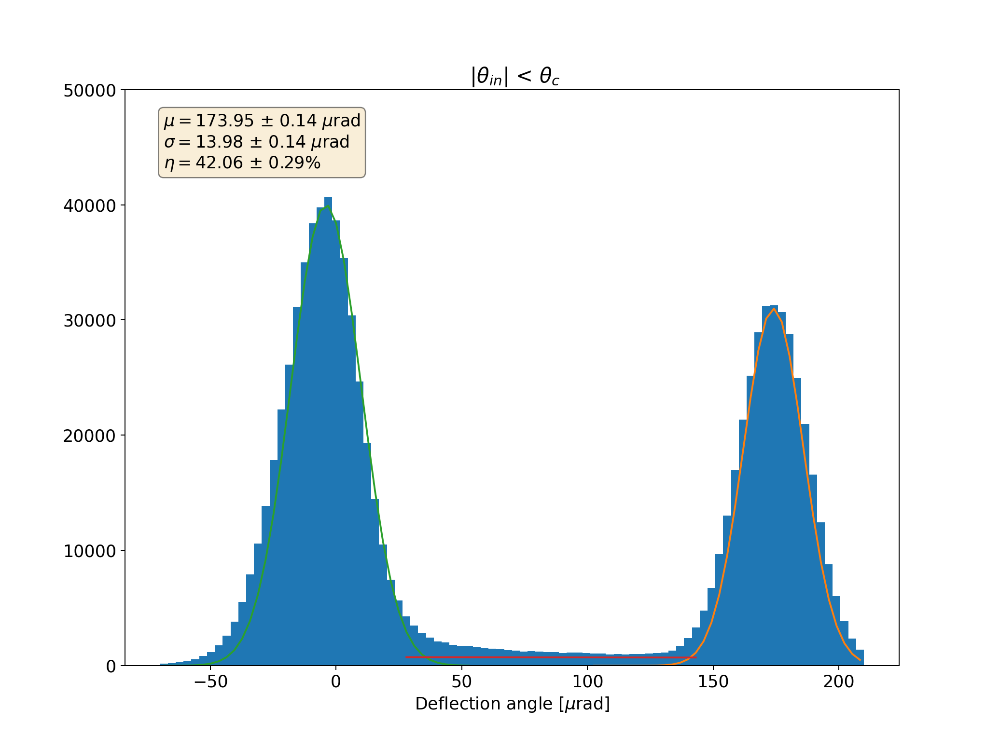

Initial bounds at AM = 9.99 and CH = 159.97

799.9999999999999 200.00000000000003
Global fit
Amorphous gaussian $\mu$ = -2.40 and $\sigma$ = 18.39
Channeling gaussian $\mu$ = 167.95 and $\sigma$ = 23.98
Dechanneling Length $L_d$ = 18.396311 mm
efficiency for full critical angle 39.29% $\pm$ 0.29%

Manual efficiency: 42.06%


Text(0.05, 0.96, '$\\mu=173.95$ $\\pm$ 0.14 $\\mu$rad\n$\\sigma=13.98$ $\\pm$ 0.14 $\\mu$rad\n$\\eta=42.06%$ $\\pm$ 0.29%')

In [20]:
############## analysis at full critiacl angle #############
############## initialise gaussian parameters  #############

full = np.array(eff_crit['defl_x'])
#print(len(full))

fig, ax = pl.subplots()
pl.xlabel(r'Deflection angle [$\mu$rad]')

ax.set_title(r' |$\theta_{in}$| < $\theta_c$ ')



xmin, xmax = -70,210
lnspc = np.linspace(xmin, xmax, 91) #50,51 at 114. 50,96 at 91

d_f, v_f, patch  = pl.hist(full,bins=lnspc,density=False,log=False, label='Normalised Data')#,weights=np.asarray(np.log(range(1,len(full)+1))))

c_f = (v_f[:-1] + v_f[1:]) / 2
param = (-4.,14.,24000,174,12.,27500)
par_f, e_f = curve_fit(bimodal, c_f[:], d_f[:],param)#, bounds=((-np.inf, 10, -np.inf, 10), (np.inf, 30, np.inf, 30)))

#pl.plot(c_f[:],bimodal(c_f[:],*param))


param_pl = (174.0,12.,31000)
par_f_pl, e_f_pl = curve_fit(gaussian, c_f[c_f>100], d_f[c_f>100],param_pl)
pl.plot(c_f[c_f>100],gaussian(c_f[c_f>100],*param_pl), label = 'Gaussian Channeling Fit')

#####GAUSSIAN 2
param_pl2 = (-4,14.,40000)
par_f_pl2, e_f_pl2 = curve_fit(gaussian, c_f[c_f<54], d_f[c_f<54],param_pl2)
pl.plot(c_f[c_f<54],gaussian(c_f[c_f<54],*param_pl2), label = 'Gaussian Amorph Fit')


mean_ch = par_f[3]
sigma_ch = par_f[4]
mean_am = par_f[0]
sigma_am = par_f[1]



############## adding dechanneling #################
dech_dw = mean_am+sigma_am*1
dech_up = mean_ch-sigma_ch*1
print('Initial bounds at AM = {:2.2f} and CH = {:2.2f}\n'.format(dech_dw,dech_up))

#fig, ax = plt.subplots()
#plt.hist(full,bins=lnspc,density=True,alpha=1,log=True)


param_1 = (-8,175,-8.,10.,2000,-300,14000,170,10.,16000)
par_1f, pcov1f = curve_fit(defl_cont, c_f[:], d_f[:], 
                         bounds=((dech_dw-5,dech_up-5,mean_am-3, sigma_am-3, 200, 200, 200,mean_ch-6, sigma_ch-10, -5), 
                                 (dech_dw+5,dech_up+5,mean_am+3, sigma_am+3, 800, 800, 800,mean_ch+6, sigma_ch+10, 5)))
print(par_1f[5],par_1f[6])
pl.plot(c_f[(c_f>25)&(c_f<145)],defl_cont(c_f[(c_f>25)&(c_f<145)],*par_1f))

mean_ch_f = par_f_pl[0]
sigma_ch_f = par_f_pl[1]
mean_am_f = par_f_pl2[0]
sigma_am_f = par_f_pl2[1]

mean_ch_f_err = np.sqrt(np.diag(e_f_pl))[0]
sigma_ch_f_err = np.sqrt(np.diag(e_f_pl))[1]


print('Global fit')
print(r'Amorphous gaussian $\mu$ = {:2.2f} and $\sigma$ = {:2.2f}'.format(par_1f[2],par_1f[3]))
print(r'Channeling gaussian $\mu$ = {:2.2f} and $\sigma$ = {:2.2f}'.format(par_1f[7],par_1f[8]))

dch_len_f = (par_1f[5]*1e-6*(cry_length/(mean_ch_f*1e-6)))*1e3
#print(par_1[5],(cry_length/(mean_ch_f*1e-6)))
print(r'Dechanneling Length $L_d$ = {:2.6f} mm'.format(dch_len_f))

pl.ylim(0,50e3)
#pl.legend(loc='upper left')

###################### efficiency ###########################
sel_full = np.array(eff_crit.loc[(eff_crit['defl_x']>=mean_ch_f) & (eff_crit['defl_x']<=(mean_ch_f+sigma_ch_f*3))]['defl_x'])
eff_f = (len(sel_full)*2)/len(eff_crit)

sel_full_plus = np.array(eff_crit.loc[(eff_crit['defl_x']>=mean_ch_f+mean_ch_f_err) & (eff_crit['defl_x']<=(mean_ch_f+mean_ch_f_err+(sigma_ch_f+sigma_ch_f_err)*3))]['defl_x'])
sel_full_minus = np.array(eff_crit.loc[(eff_crit['defl_x']>=mean_ch_f-mean_ch_f_err) & (eff_crit['defl_x']<=(mean_ch_f-mean_ch_f_err+(sigma_ch_f-sigma_ch_f_err)*3))]['defl_x'])
eff_f_plus = (len(sel_full_plus)*2)/len(eff_crit)
eff_f_minus = (len(sel_full_minus)*2)/len(eff_crit)
eff_f_error = (eff_f_minus-eff_f_plus)/2.

ef_f = 2*sum(d_f[c_f>mean_ch_f])/sum(d_f)

print(r'efficiency for full critical angle {:2.2%} $\pm$ {:2.2%}'.format(eff_f,eff_f_error ))
print(f"\nManual efficiency: {ef_f*100:.2f}%")

#eff_f = eff_f*100
#eff_f_error *=100

Chisq = sum((d_f-bimodal(c_f,*param))**2/np.std(d_f)**2)#/(len(d_f)-6)
#Chisq = sum((d_f[110:]-gaussian(c_f[110:],*param_pl))**2/np.std(d_f[110:])**2)#/(len(d_f[110:])-6)

textstr = '\n'.join((
    r'$\mu=%.2f$ $\pm$ %.2f $\mu$rad' % (mean_ch_f ,mean_ch_f_err, ),
    r'$\sigma=%.2f$ $\pm$ %.2f $\mu$rad' % (sigma_ch_f,sigma_ch_f_err,),
    #r'$\eta=%.2f$ $\pm$ %.2f ' % (eff_f,eff_f_error, )))
    r'$\eta={:2.2%}$ $\pm$ {:2.2%}'.format(ef_f,eff_f_error),))
    #r'$\chi=%.2f$' % (Chisq),))

props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.96, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)

<IPython.core.display.Javascript object>


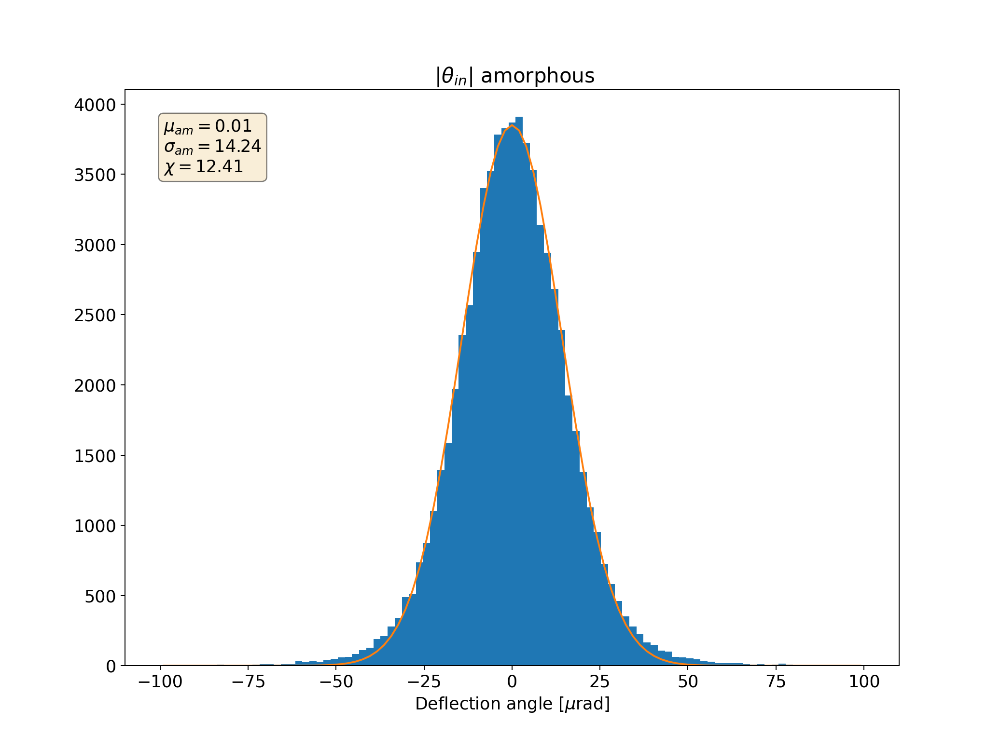

0.011500391328975899 14.240375753641729
Chi2: 12.40822252907826


Text(0.05, 0.95, '$\\mu_{am}=0.01$\n$\\sigma_{am}=14.24$\n$\\chi=12.41$')

In [21]:
am_df = data.loc[(data['thetaIn_corr']>-100.) & (data['thetaIn_corr']<-35)]

am = np.array(am_df['defl_x'])



fig, ax = pl.subplots()
pl.xlabel(r'Deflection angle [$\mu$rad]')
# plot normed histogram

ax.set_title(r' |$\theta_{in}$| amorphous ')

# find minimum and maximum of xticks, so we know
# where we should compute theoretical distribution
#xt = plt.xticks()[0]  
#xmin, xmax = min(half), max(half)  
xmin, xmax = -100,100
lnspc = np.linspace(xmin, xmax, 100)
#print(xmin,xmax)

#half = np.histogram(eff_half['KICK_REAL'],bins=100,range=(xmin,xmax))

#print(half)

dist, values, patch  = pl.hist(am,bins=lnspc)#,normed='True')
#print (len(dist), values, patch)
center = (values[:-1] + values[1:]) / 2
#print (center)
param = [0.,12.,25000]
popt, pcov = curve_fit(gaussian,center,dist,param)
#dgaus = np.(popt)

mean_am = popt[0]
sigma_am = popt[1]

print(mean_am,sigma_am)

#print(center)
Chisq_am = sum((dist[dist>0]-gaussian(center[dist>0],*popt))**2/(dist[dist>0]))/(len(dist)-3)
print('Chi2:', Chisq_am)


pl.plot(center,gaussian(center,*popt))

textstr = '\n'.join((
    r'$\mu_{am}=%.2f$' % (mean_am , ),
    r'$\sigma_{am}=%.2f$' % (sigma_am, ),
    r'$\chi=%.2f$' % (Chisq_am),))

props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)


[-38.12512214 -34.60620829  -3.16742062 ... -44.4928804  -13.78801724
 -19.03262166]


<IPython.core.display.Javascript object>


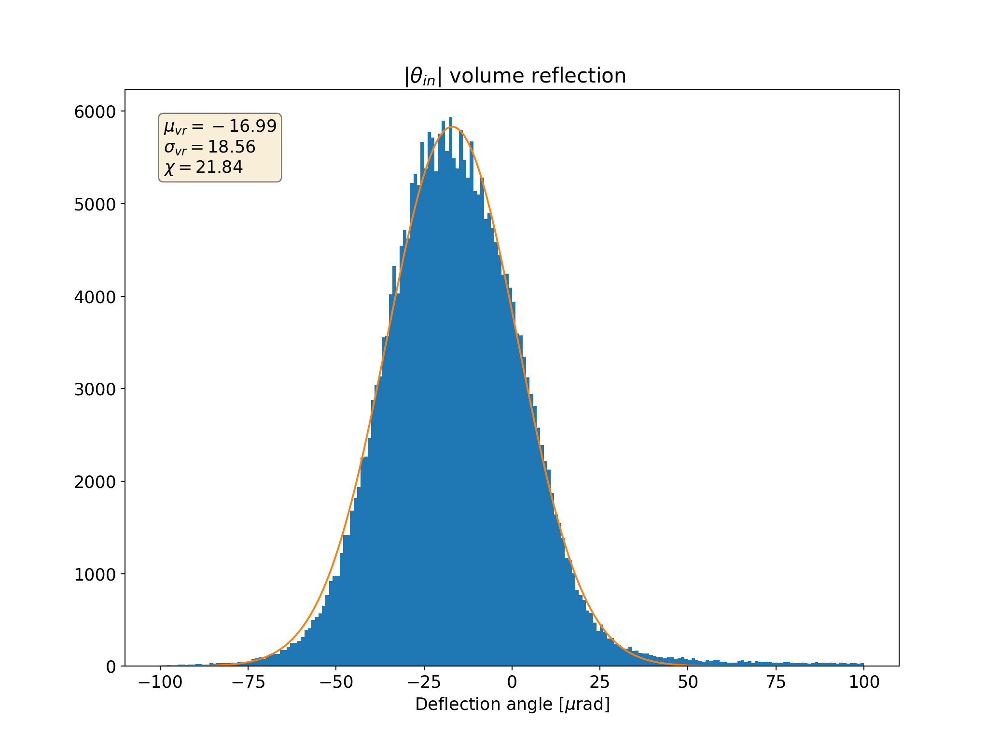

-16.99018018768311 18.564840773237364
Chi2: 21.84335778985102


Text(0.05, 0.95, '$\\mu_{vr}=-16.99$\n$\\sigma_{vr}=18.56$\n$\\chi=21.84$')

In [22]:
#vr_df = data.loc[(data['thetaIn_corr']>-45.) & (data['thetaIn_corr']<0.)]
vr_df = data.loc[(data['thetaIn_corr']>25.) & (data['thetaIn_corr']<100.)]# & (data['defl_x']>-80) & (data['defl_x']<10)]

vr = np.array(vr_df['defl_x'])

vr_sel = np.array(vr_df.loc[vr_df['defl_x']<=0.]['defl_x'])
print(vr_sel)

fig, ax = pl.subplots()
pl.xlabel(r'Deflection angle [$\mu$rad]')
# plot normed histogram

ax.set_title(r' |$\theta_{in}$| volume reflection ')

# find minimum and maximum of xticks, so we know
# where we should compute theoretical distribution
#xt = plt.xticks()[0]  
#xmin, xmax = min(half), max(half)  
xmin, xmax = -100,100
lnspc = np.linspace(xmin, xmax, 201)
#print(xmin,xmax)

#half = np.histogram(eff_half['KICK_REAL'],bins=100,range=(xmin,xmax))

#print(half)

dist, values, patch  = pl.hist(vr,bins=lnspc,density=False)

#dist_sel = dist[:-48]
#values_sel = values[:-48]


center = (values[:-1] + values[1:]) / 2
#print (center)
param = (-14,22,5200)
popt, pcov = curve_fit(gaussian,center,dist,param)
#dgaus = np.(popt)

mean_vr = popt[0]
sigma_vr = popt[1]

print(mean_vr,sigma_vr)

#print(center)
Chisq_vr = sum((dist-gaussian(center,*popt))**2/(dist))/(len(dist)-3)
print('Chi2:', Chisq_vr)

pl.plot(center,gaussian(center,*popt))

textstr = '\n'.join((
    r'$\mu_{vr}=%.2f$' % (mean_vr , ),
    r'$\sigma_{vr}=%.2f$' % (sigma_vr, ),
    r'$\chi=%.2f$' % (Chisq_vr),))
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)
ax.text(0.05, 0.95, textstr, transform=ax.transAxes, fontsize=14,
        verticalalignment='top', bbox=props)